In [1]:
%matplotlib inline

from boututils.datafile import DataFile
from boutdata.collect import collect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import platform
import traceback
import xarray
import xbout
import scipy
import re

onedrive_path = onedrive_path = str(os.getcwd()).split("OneDrive")[0] + "OneDrive"
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\sdtools"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages\soledge"))
sys.path.append(os.path.join(onedrive_path, r"Project\python-packages"))

from hermes3.utils import *

import gridtools.solps_python_scripts.setup
from gridtools.solps_python_scripts.utilities.last10s       import read_last10s

from hermes3.fluxes import *
from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *

from code_comparison.code_comparison import *
from code_comparison.viewer_2d import *


%load_ext autoreload
%autoreload 2

plt.close("all")
%matplotlib inline

print("Done")


st40_phys_viewer can not be loaded from outside Tokamak Energy!

Done


# Overview

### I tuned fast recycling and went to MFP 0.1 with separate limiters and conduction limitation

# Hermes IO

In [2]:
casestore = dict()

In [3]:
   
db = CaseDB()
toload = [
    dict(name="base", id="d19g-also_noescapecore"),
    dict(name="esccore_edgerefl_decaylength", id="d19c-also_nofrec"),
    dict(name="frec", id = "d19bb-new_frec"),
    dict(name="pump", id = "d19aeb-noafn_all_newfrec_retry"),
    dict(name="frec_tune", id = "d19aec-also_tune_frec"),
    dict(name="afnD_mfp1", id = "d22eb-also_mfp1"),
    dict(name="afnE_mfp1", id = "d24b-tunefrec_E_AFN_mfp1.0"),
    dict(name="afnE_mfp1_cond0.75", id = "d24ba-E_mfp1_cond0.75"),
    dict(name="afnE_mfp1_cond0.5", id = "d24bb-E_mfp1_cond0.5"),
    dict(name="afnE_mfp1_cond0.25", id = "d24bc-E_mfp1_cond0.25"),
    dict(name="afnE_mfp1_cond0.25_frec0.00", id = "d25c-final_no_frec"),
    dict(name="afnE_mfp1_cond0.25_frec0.48", id = "d24bd-cond0.25_frec0.48"),
    dict(name="afnE_mfp1_cond0.25_frec0.68", id = "d24bdb-cond0.25_frec0.68"),
    dict(name="afnE_mfp1_cond0.25_frec0.48_nonrefl", id = "d25b-final_no_nrefl"),
    # dict(name="afn_unch", id = "d20bd-allbc_afnv2_mfp10_ntune"),
    # dict(name="afn_new", id = "d21-allbc_afn_vb1_newfrec"),
    # dict(name="afn_new_cond0.1", id = "d21a-cond_alpha_0.1")
]
casestore = {}
for case in toload:
    casestore[case["name"]] = db.load_case_2D(case["id"], use_squash = True, verbose = True)

- Reading case d19g-also_noescapecore
-----------------------
- Looking for squash file
- Squash file found. squash date 10/17/2023, 13:50:03, dmp file date 10/16/2023, 18:40:17

- Reading case d19c-also_nofrec
-----------------------
- Looking for squash file
- Squash file found. squash date 09/25/2023, 15:41:04, dmp file date 09/18/2023, 11:18:35

- Reading case d19bb-new_frec
-----------------------
- Looking for squash file
- Squash file found. squash date 10/15/2023, 11:18:34, dmp file date 10/10/2023, 21:17:58

- Reading case d19aeb-noafn_all_newfrec_retry
-----------------------
- Looking for squash file
- Squash file found. squash date 10/08/2023, 13:37:09, dmp file date 10/08/2023, 12:34:28

- Reading case d19aec-also_tune_frec
-----------------------
- Looking for squash file
- Squash file found. squash date 10/15/2023, 11:20:05, dmp file date 10/10/2023, 17:53:43

- Reading case d22eb-also_mfp1
-----------------------
- Looking for squash file
- Squash file found. squash dat

In [4]:
plt.close("all")
%matplotlib inline

## Read Hermes data

In [52]:
hr = dict()
for name in casestore.keys(): 
    print(name)
    hr[name] = Hermesdata()
    hr[name].read_case(casestore[name].ds.isel(t=-1, x = slice(2,-2)))
    
    if "afnE" in  name:
        new_afn = True
        print(f"Loading {name} with new AFN")
    else:
        new_afn = False
        print(f"Loading {name} with old AFN")
    
    ds = casestore[name].ds
    ds = calculate_radial_fluxes(ds, new_afn = new_afn)
    # ds = calculate_target_fluxes(ds)
    ds = reverse_pfr_fluxes(ds)

base
Loading base with old AFN
esccore_edgerefl_decaylength
Loading esccore_edgerefl_decaylength with old AFN
frec
Loading frec with old AFN
pump
Loading pump with old AFN
frec_tune
Loading frec_tune with old AFN
afnD_mfp1
Loading afnD_mfp1 with old AFN
afnE_mfp1
Loading afnE_mfp1 with new AFN
afnE_mfp1_cond0.75
Loading afnE_mfp1_cond0.75 with new AFN
afnE_mfp1_cond0.5
Loading afnE_mfp1_cond0.5 with new AFN
afnE_mfp1_cond0.25
Loading afnE_mfp1_cond0.25 with new AFN
afnE_mfp1_cond0.25_frec0.00
Loading afnE_mfp1_cond0.25_frec0.00 with new AFN
afnE_mfp1_cond0.25_frec0.48
Loading afnE_mfp1_cond0.25_frec0.48 with new AFN
afnE_mfp1_cond0.25_frec0.68
Loading afnE_mfp1_cond0.25_frec0.68 with new AFN
afnE_mfp1_cond0.25_frec0.48_nonrefl
Loading afnE_mfp1_cond0.25_frec0.48_nonrefl with new AFN


# Read SOLEDGE CSV data

In [6]:
soledgecases = {
    "tightwall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_1e19"), # Hermes-3 like wall
    "tightwall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_2e19"), # Hermes-3 like wall
    "widewall_2e19_5m" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19_5M"),
    "tightwall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallMike_bra_nocore_D_3e19"), # Hermes-3 like wall
    "widewall_1e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_1e19"), 
    "widewall_2e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_2e19"), 
    "widewall_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\soledge_cases\ST40_wallStd_bra_nocore_D_3e19"), 
}

sl = dict()

for name in soledgecases:
    path = soledgecases[name]
    sl[name] = SOLEDGEdata(path = path)
    sl[name].read_csv(os.path.join(path, "omp_plasma.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "omp_neutrals.csv"), mode = "plot1d_omp")
    sl[name].read_csv(os.path.join(path, "imp_plasma.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "imp_neutrals.csv"), mode = "plot1d_imp")
    sl[name].read_csv(os.path.join(path, "wall_ntmpi_plasma.csv"), mode = "wall_ntmpi")



c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)
c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astyp

## Read SOLPS

In [7]:
solpscases = {
    "base" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5"),
    "noiz_core" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16"),
    "gammai_2.5" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.GAMMAI=2.5E+00"),
    "dpuff_1e22" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=1.0E+22"),
    "dpuff_5e21" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=5.0E+21"),
    "no_fast_reflec" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.Pf=0"),
    "nsep_2e19" : os.path.join(onedrive_path,r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=2E+19"),
    "nsep_3e19" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\.core_extent.b2tqca_phm0=0.nesepm=3E+19"),
    "narrow_core" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.core_extent"),
    "no_visc" : os.path.join(onedrive_path, r"Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.core_extent.b2tqca_phm0=0"),
    "16x_mc" : os.path.join(onedrive_path, r"C:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE_core_extent\HERMES_SOLEDGE.S33600_Tamb_case.xxx.BCCON=16.core_extent.MC.histories.x16-ish.NOT.converged"),
}

sp = dict()

for name in solpscases:
    sp[name] = SOLPSdata()
    sp[name].read_last10s(solpscases[name])

c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.GAMMAI=2.5E+00\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\compare_data\playAround_ST40_IVC2_HERMES_SOLEDGE\HERMES_SOLEDGE.S33600_Tamb_case.SEE=0.BGK=OFF.SOLEDGE.reactions.input.dat.OK.Js=OFF.GAMMAE=4.5.eirene_ionising_core=0.BCCON=16.D2PUFF=1.0E+22\last10s.pkl loaded
c:\Users\mikek\OneDrive\Project\collab\tech\co

# Baseline vs. boundary conditions

In [8]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl'])

In [10]:
hr["base"].regions.keys()

dict_keys(['omp', 'imp', 'outer_lower', 'outer_upper', 'inner_lower', 'outer_fieldline'])

In [ ]:
sl["tightwall_1e19"].regions["outer_fieldline"]

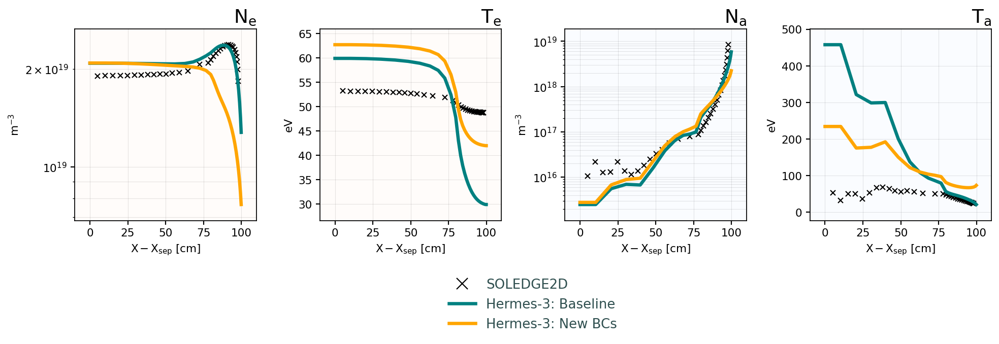

In [19]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    r"Hermes-3: Baseline" : dict(data=hr['base'], color = "teal"),
    r"Hermes-3: New BCs" : dict(data=hr['pump'], color = "orange"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    # regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    regions = ["outer_fieldline"],
    # regions = ["outer_lower"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["Ne", "Te", "Na", "Ta"],
    # params = ["Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    mode = "log",
    dpi = 120,
    lw = 2
)

# First AFN implementation

In [10]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1'])

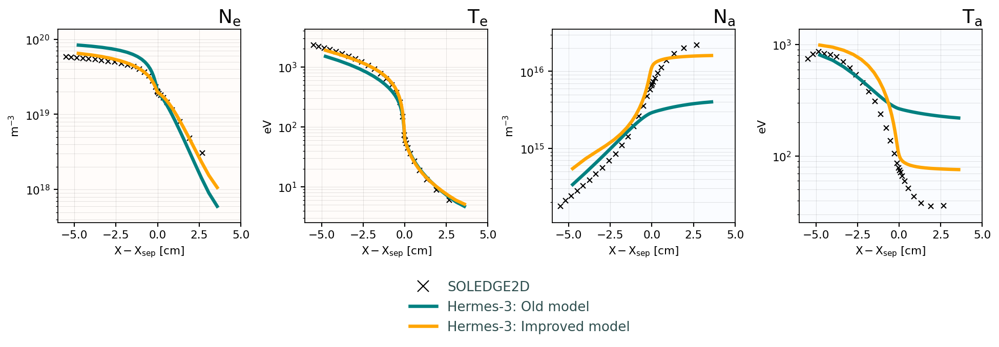

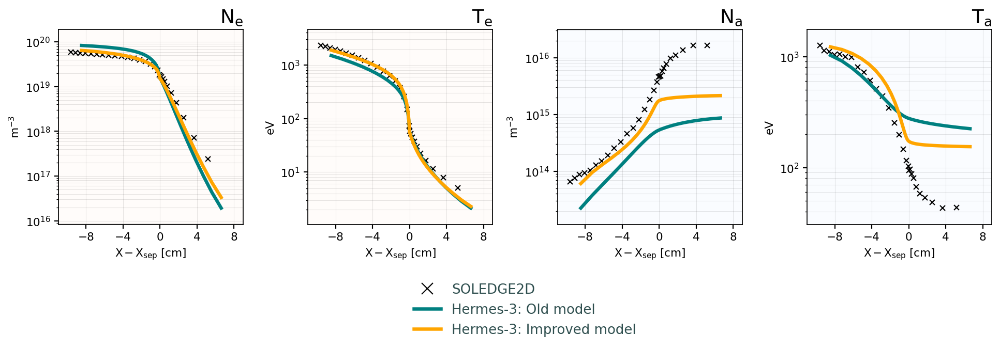

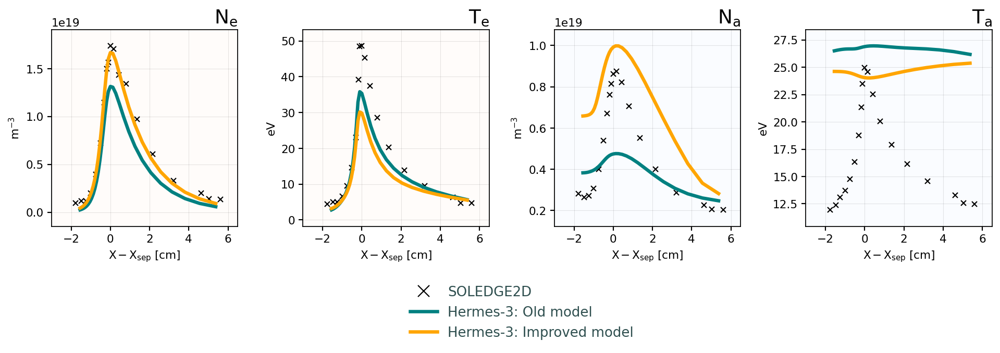

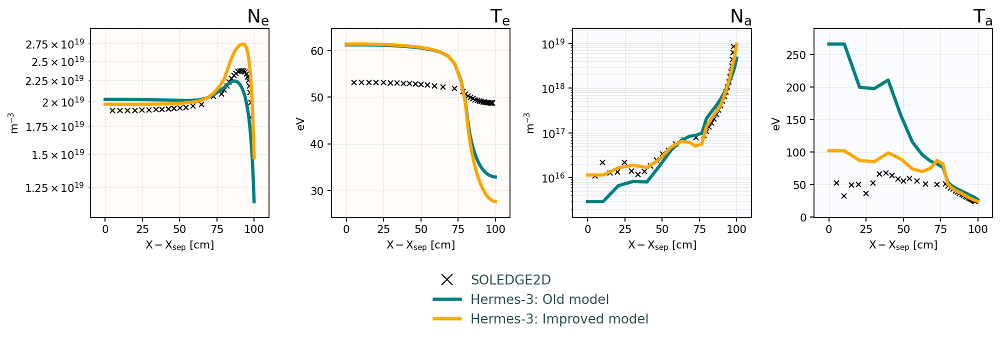

In [20]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "orange"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    # regions = ["outer_lower"],
    # params = ["Ne", "Te"],
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["Ne", "Te", "Na", "Ta"],
    # params = ["Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    mode = "log",
    dpi = 120,
    lw = 2
)

In [12]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1'])

## Neutral transport

### Particles at OMP

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


Text(0.5, 1.0, 'Particle transport at OMP')

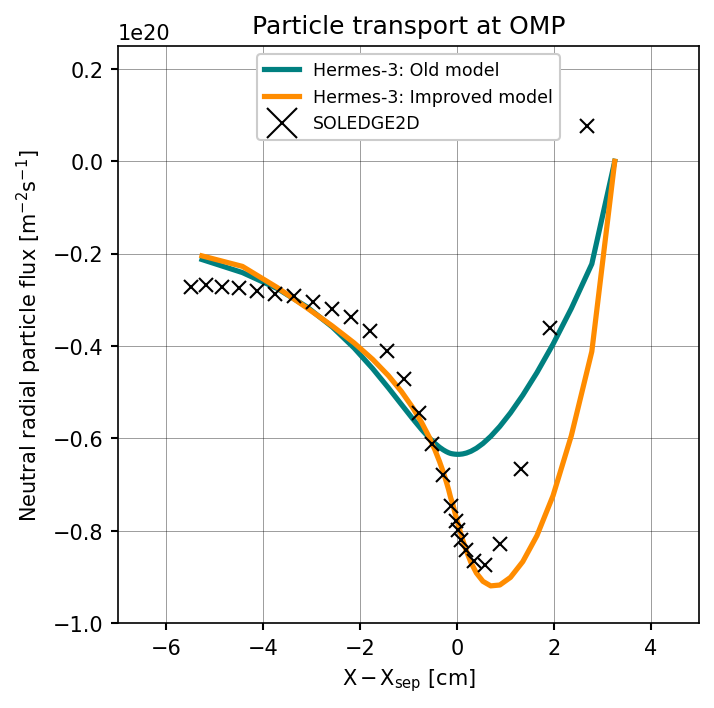

In [62]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)
cases = ["frec_tune", "afnE_mfp1"]
labels = ["Hermes-3: Old model", "Hermes-3: Improved model"]
colors =None
# labels = ["flim=1", "flim=0.9", "flim=0.7"]

# colors = ["teal", "darkorange", "limegreen", "deeppink"]

for i, case in enumerate(cases):
    
    ds = casestore[case].ds.isel(t=-1)
    d = ds.isel(x=slice(2,-2)).sum("theta")
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])
    
    label = case if labels is None else labels[i]
    
    kwargs = {} if colors is None else dict(color = colors[i])
    ax.plot(dist*100, omp["pf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), label = label, lw = 2.5, **kwargs)

# SOLEDGE
slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
df = slc.get_1d_radial_data(["vxni", "Nni"])
df["NVxn"] = df["vxni"] * df["Nni"]
ax.plot(df["dist"]*100, df["NVxn"], lw=0, marker = "x", ms = 7, markeredgewidth=1.0, label = "SOLEDGE2D", c = "black")


ax.set_ylabel("Neutral radial particle flux $[m^{-2}s^{-1}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")
ax.legend(loc = "upper center",  fontsize="small", frameon=True, framealpha = 1)
ax.set_xlim(-0.07*100, 0.05*100)
ax.set_ylim(-1.0e20, 0.25e20)

casestore.keys()
ax.grid(color = "k", alpha = 0.6)
ax.set_title("Particle transport at OMP")

### Particles at different poloidal index

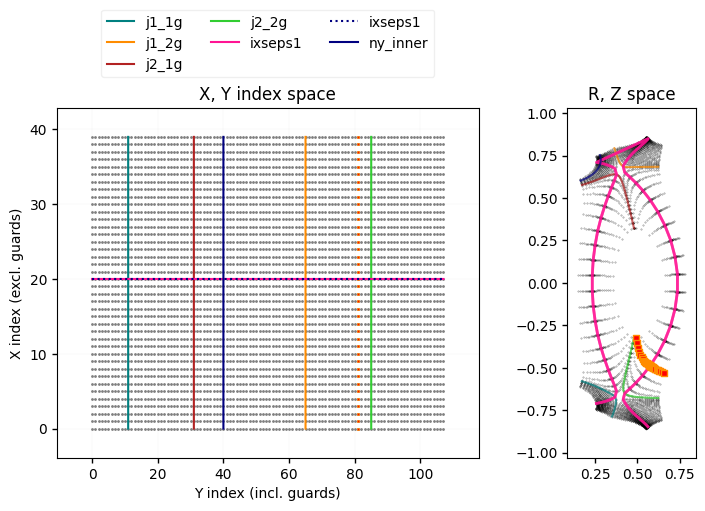

In [96]:
plot_selection(ds, ds.isel(theta=81))

Text(0.5, 1.0, 'Particle transport at OMP')

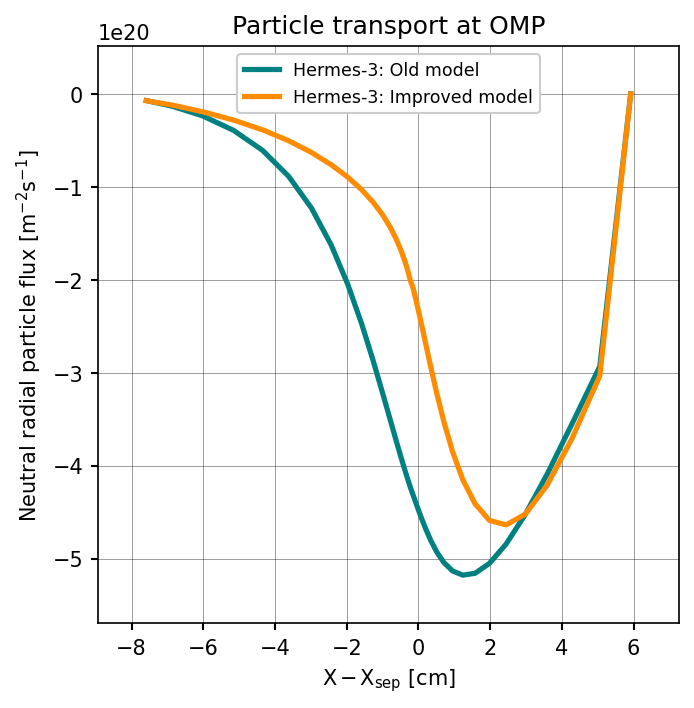

In [98]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)
cases = ["frec_tune", "afnE_mfp1"]
labels = ["Hermes-3: Old model", "Hermes-3: Improved model"]
colors =None
# labels = ["flim=1", "flim=0.9", "flim=0.7"]

# colors = ["teal", "darkorange", "limegreen", "deeppink"]

for i, case in enumerate(cases):
    
    ds = casestore[case].ds.isel(t=-1)
    d = ds.isel(x=slice(2,-2)).sum("theta")
    # omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    omp = ds.isel(theta = 81, x = slice(2,-2))
    dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])
    
    label = case if labels is None else labels[i]
    
    kwargs = {} if colors is None else dict(color = colors[i])
    ax.plot(dist*100, omp["pf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), label = label, lw = 2.5, **kwargs)

# SOLEDGE
# slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
# df = slc.get_1d_radial_data(["vxni", "Nni"])
# df["NVxn"] = df["vxni"] * df["Nni"]
# ax.plot(df["dist"]*100, df["NVxn"], lw=0, marker = "x", ms = 7, markeredgewidth=1.0, label = "SOLEDGE2D", c = "black")


ax.set_ylabel("Neutral radial particle flux $[m^{-2}s^{-1}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")
ax.legend(loc = "upper center",  fontsize="small", frameon=True, framealpha = 1)
# ax.set_xlim(-0.07*100, 0.05*100)
# ax.set_ylim(-1.0e20, 0.25e20)

casestore.keys()
ax.grid(color = "k", alpha = 0.6)
ax.set_title("Particle transport at OMP")

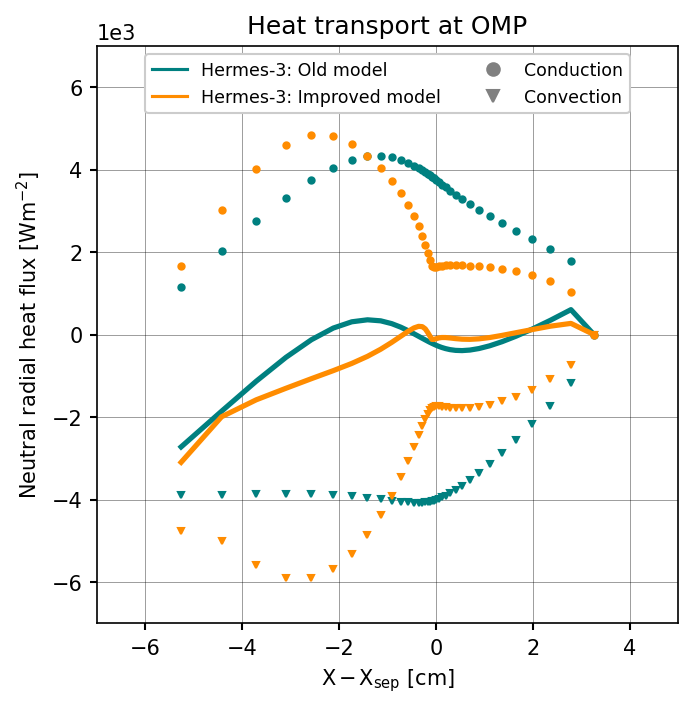

In [60]:
fig, ax = plt.subplots(figsize = (5,5), dpi = 150)

colors = ["teal", "darkorange", "firebrick", "limegreen", "mediumblue", "darkorchid", "deeppink", 
                                                   "#1E90FF", "forestgreen", "#4169e1", "darkgoldenrod", "#9370db", "crimson", "#2f4f4f" ]

cases = ["frec_tune", "afnE_mfp1"]
labels = ["Hermes-3: Old model", "Hermes-3: Improved model"]

for i, case in enumerate(cases):
    
    ds = casestore[case].ds.isel(t=-1)
    d = ds.isel(x=slice(2,-2)).sum("theta")
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    dist = (omp["R"] - omp["R"][ds.metadata["ixseps1"]])
    ax.plot(dist*100, omp["hf_perp_diff_R_d"] / (omp["dy"]*omp["dz"]), color = colors[i],  lw = 0, ms = 3, marker = "o")
    ax.plot(dist*100, omp["hf_perp_conv_R_d"] / (omp["dy"]*omp["dz"]),  color = colors[i],  lw = 0, ms = 3, marker = "v")
    ax.plot(dist*100, omp["hf_perp_tot_R_d"] / (omp["dy"]*omp["dz"]),  color = colors[i], ls = "-", lw = 2.5)

# SOLPS
# ax.plot(sp["nsep_2e19"].regions["omp"].index*100, sp["nsep_2e19"].regions["omp"]["pfluxa3da"] * -1, label = "SOLPS wide wall (lo res)", color = "black", lw=0, marker = "o", ms = 3)
# ax.plot(sp["16x_mc"].regions["omp"].index*100, sp["16x_mc"].regions["omp"]["pefluxa3da"] * -1, label = "SOLPS wide wall (hi res)", color = "black", lw=0, marker = "o", ms = 3)

ax.set_ylabel("Neutral radial heat flux $[Wm^{-2}]$")
ax.set_xlabel("$X - X_{sep}$ [cm]")

ax.set_xlim(-0.07*100, 0.05*100)
ax.set_ylim(-7e3, 7e3)
ax.set_title("Heat transport at OMP")
ax.grid(color = "k", alpha = 0.6)

legend_items = []
for i, name in enumerate(cases):
    legend_items.append(mpl.lines.Line2D([0], [0], color=colors[i]))
    
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "o", ms = 3))
legend_items.append(mpl.lines.Line2D([0], [0], color="grey", lw = 0, marker = "v", ms = 3))
ax.legend(legend_items, labels + ["Conduction", "Convection"], fontsize = "small", loc = "upper center", frameon = True, framealpha = 1,ncols = 2)

In [63]:
ds = casestore["afnE_mfp1"].ds

Ta = ds["Td"].values
Ti = ds["Td+"].values
Ne = ds["Ne"].values
Na = ds["Nd"].values
Vi = ds["Vd+"]
Va = ds["NVd"] / (ds["Nd"] * constants("mass_p")*2)

ln_sigmav = -18.5028
Teff = (Ta + Ti)/2
lnT = np.log(Teff)
lnT_n = lnT.copy()

for b in [0.3708409, 7.949876e-3, -6.143769e-4, -4.698969e-4, -4.096807e-4, 1.440382e-4, -1.514243e-5, 5.122435e-7]:
    ln_sigmav += b * lnT_n
    lnT_n *= lnT
    
nu_cx = np.exp(ln_sigmav) * 1e-6 * Ne # convert from cm^3/s to m^3/s
nu = nu_cx  # Only consider CX for now
v_thi = np.sqrt((ds["Td+"]*constants("q_e")) / (constants("mass_p")*2))
v_thn = np.sqrt((ds["Td"]*constants("q_e")) / (constants("mass_p")*2))

Vi_pol = Vi / (ds["J"] / np.sqrt(ds["g_22"]))
Va_pol = Va / (ds["J"] / np.sqrt(ds["g_22"]))

# From Meier, eqn (17)
v_cx = np.sqrt(4/np.pi * v_thi**2 + 4/np.pi * v_thn**2 + np.abs(Vi_pol - Va_pol)**2)

L_T_rad = 1 / (ds["Td+"].bout.ddx() / ds["Td+"])
L_T_pol = 1 / (ds["Td+"].bout.ddy() / ds["Td+"])

mfp = v_cx / nu


Kn_rad = abs(mfp / L_T_rad)
Kn_pol = abs(mfp / L_T_pol)

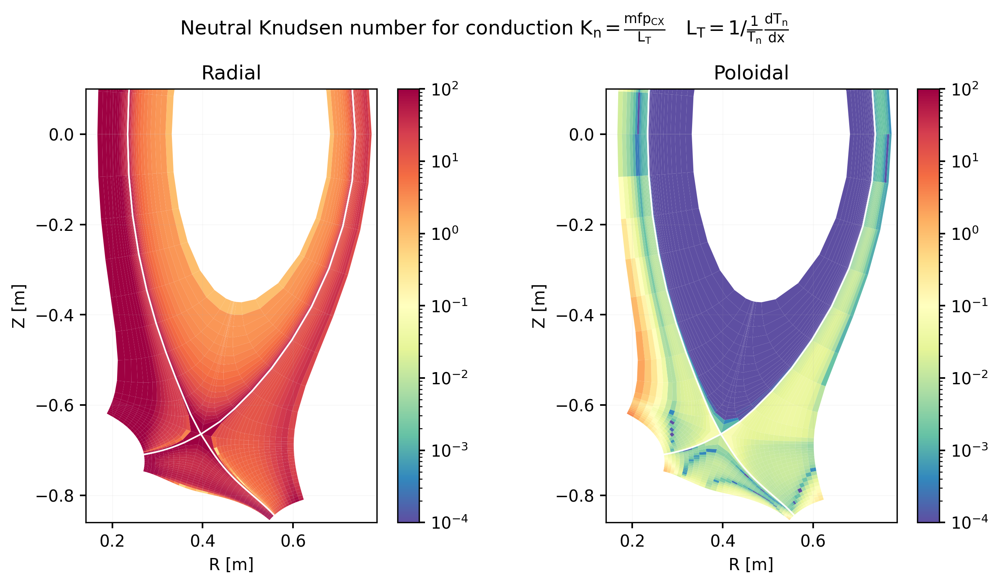

In [68]:
fig, axes = plt.subplots(1,2, figsize = (9,5), dpi = 300)
Kn_rad.hermesm.clean_guards().bout.polygon(ax = axes[0], cmap = "Spectral_r", vmin = 1e-4, vmax = 100, logscale = True, add_colorbar = True, antialias = True)
axes[0].set_title(r"Radial")
Kn_pol.hermesm.clean_guards().bout.polygon(ax = axes[1], cmap = "Spectral_r", vmin = 1e-4, vmax = 100, logscale = True, add_colorbar = True, antialias = True)
axes[1].set_title(r"Poloidal")
fig.suptitle(r"Neutral Knudsen number for conduction $K_{n} = \frac{mfp_{CX}}{L_{T}}$   $L_{T} = 1 / \frac{1}{T_{n}} \frac{dT_{n}}{dx}$")


for ax in axes:
    ax.set_ylim(-0.86, 0.1)
    
fig.tight_layout()


# Scan in conductivity

In [70]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25'])

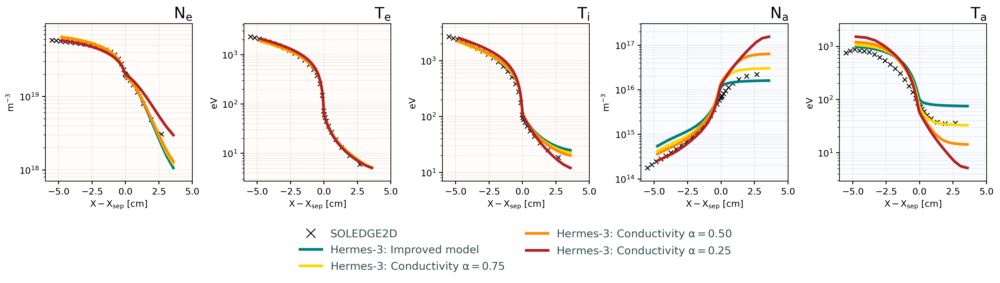

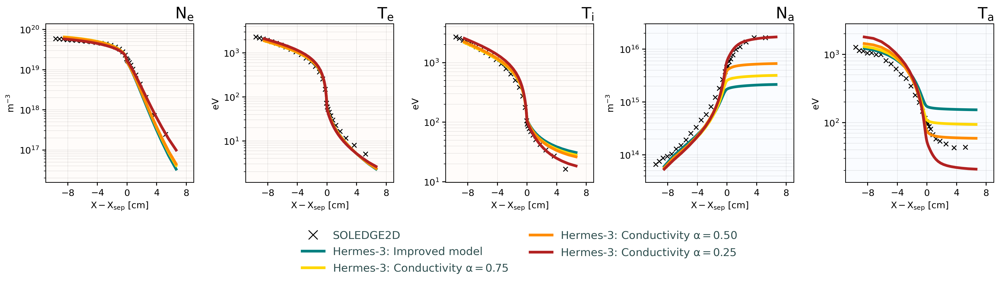

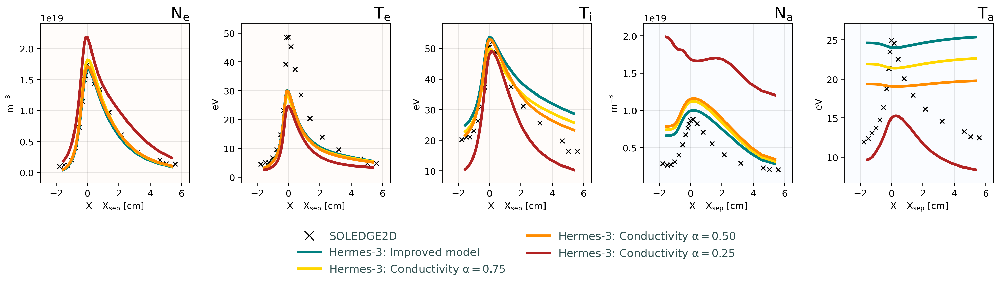

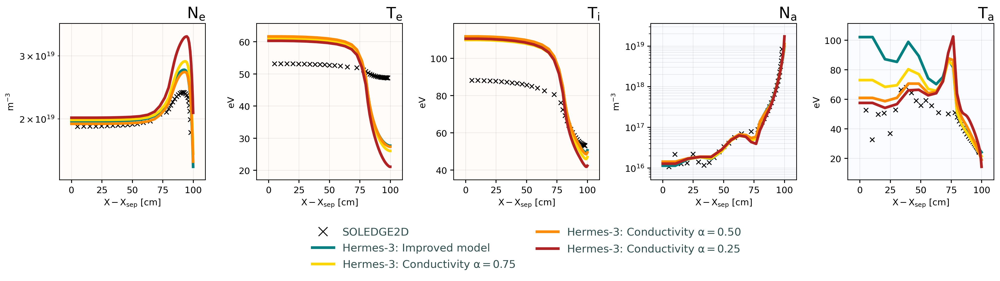

In [22]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    # r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "teal"),
    r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "gold"),
    r"Hermes-3: Conductivity $\alpha = 0.50$" : dict(data=hr['afnE_mfp1_cond0.5'], color = "darkorange"),
    r"Hermes-3: Conductivity $\alpha = 0.25$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "firebrick"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"],  
    # regions = ["outer_lower"],
    # params = ["Ne", "Te"],
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Ne", "Te", "Na", "Ta"],
    # params = ["Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    mode = "log",
    dpi = 200,
    lw = 2
)

# Scan in fast recycling energy fraction

In [93]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68'])

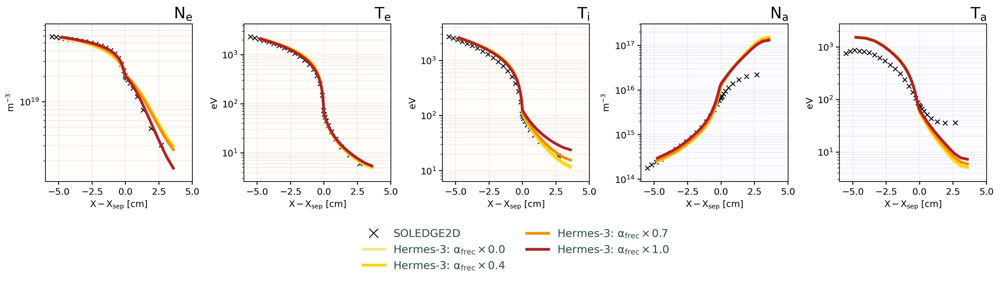

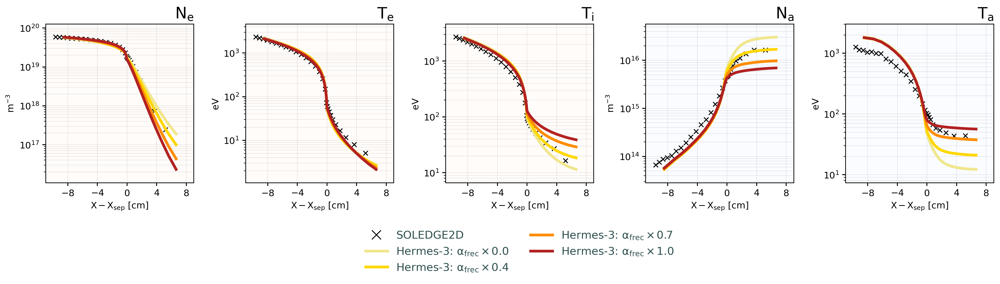

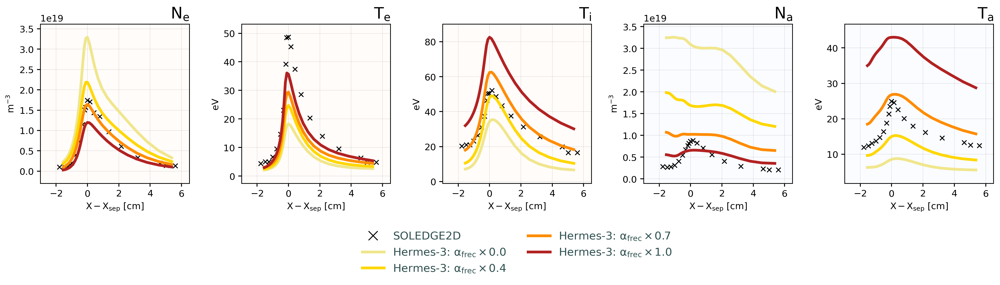

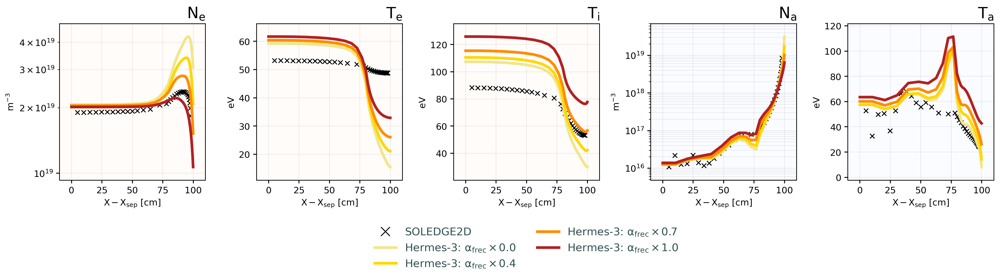

In [41]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    # r"Hermes-3: Baseline" : dict(data=hr['base'], color = "teal"),
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    # r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "teal"),
    # r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "gold"),
    r"Hermes-3: $\alpha_{frec}\times 0.0$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.00'], color = "khaki"),
    r"Hermes-3: $\alpha_{frec}\times 0.4$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "gold"),
    r"Hermes-3: $\alpha_{frec}\times 0.7$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "darkorange"),
    r"Hermes-3: $\alpha_{frec}\times 1.0$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.68'], color = "firebrick"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    params = ["Ne", "Te", "Td+", "Na", "Ta"],

    mode = "log",
    dpi = 200,
    lw = 2
)

# Final match

In [44]:
ds = casestore["afnE_mfp1_cond0.25_frec0.48"].ds.isel(t=-1)
((ds["Rd+_ex"] + ds["Rd+_rec"]).hermesm.clean_guards() * ds["dv"]).sum().values * 1e-6

-0.22773802365920456

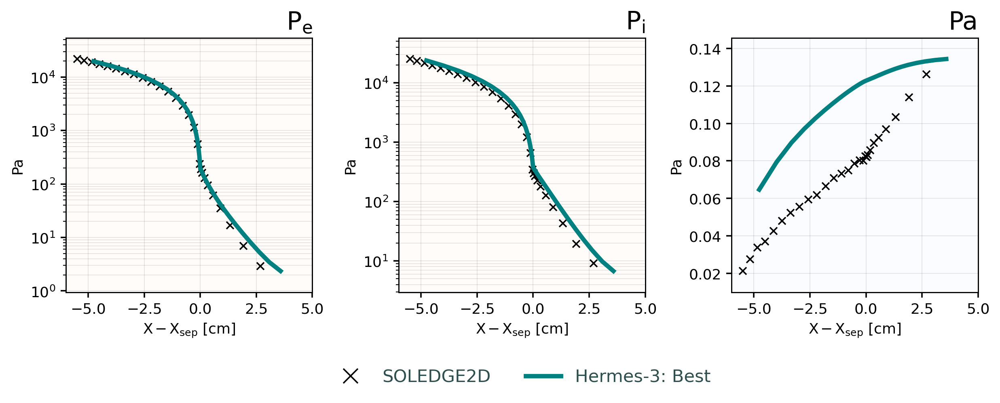

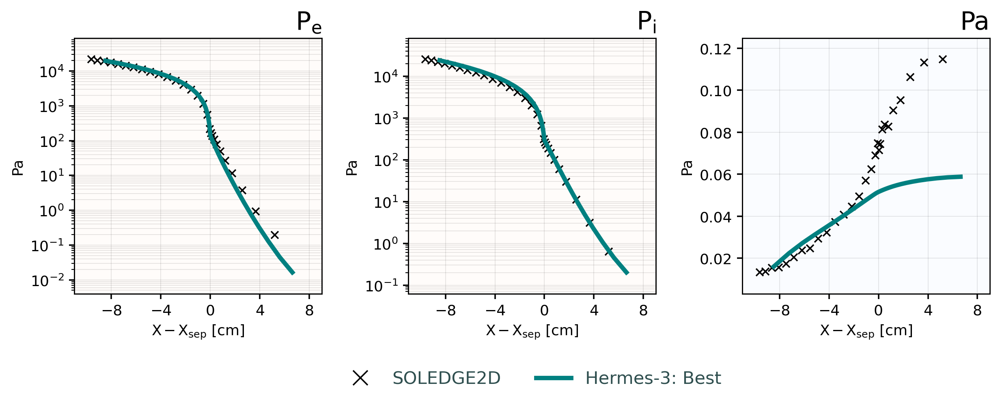

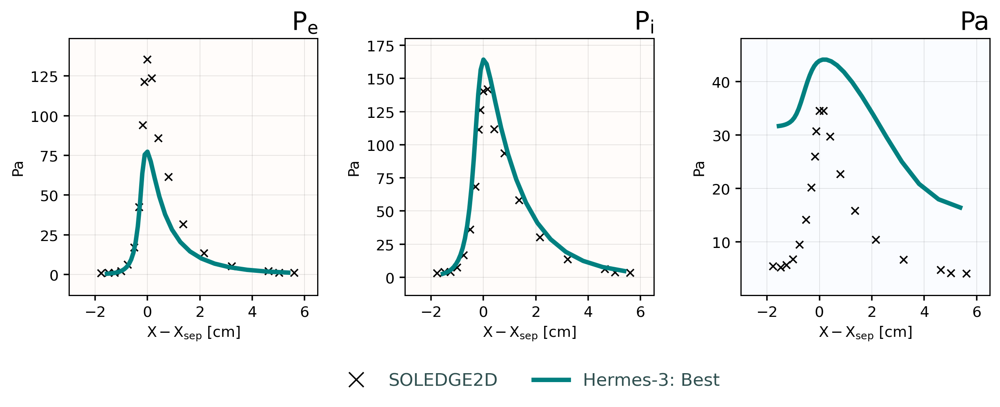

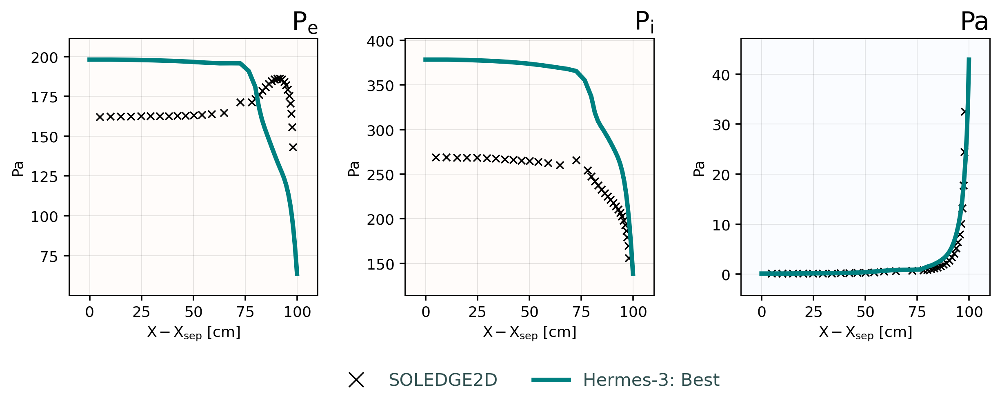

In [24]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    # "SOLEDGE2D: Wide domain" : dict(data=sl["widewall_2e19"], color="black", marker = "o", markerfacecolor="None", markeredgewidth = 0.5),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    # r"Hermes-3: Baseline" : dict(data=hr['base'], color = "teal"),
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    # r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "teal"),
    # r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "gold"),
    # r"Hermes-3: $\alpha_{frec}\times 0.0$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.00'], color = "khaki"),
    # r"Hermes-3: $\alpha_{frec}\times 0.4$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "gold"),
    
    # r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.68'], color = "teal"),
    r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "teal"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    # params = ["Ne", "Te", "Td+", "Na", "Ta"],
    params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1
)

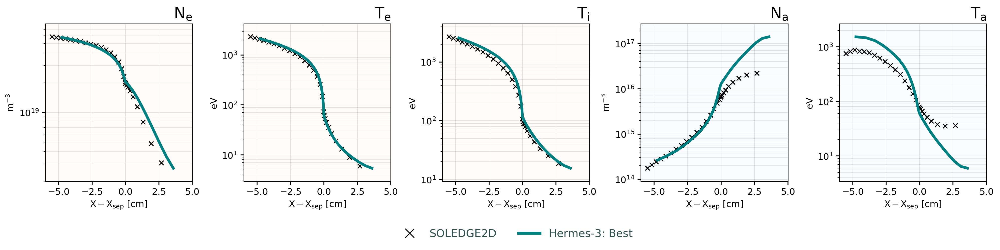

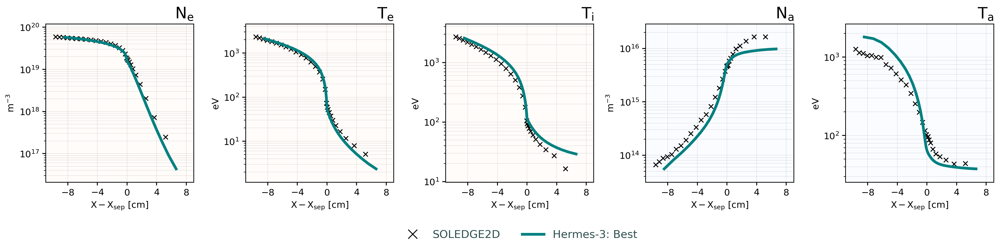

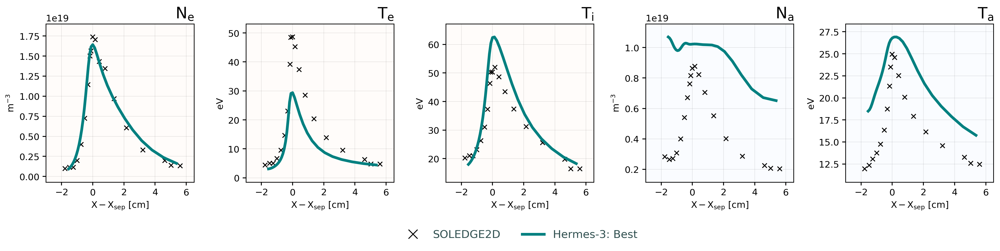

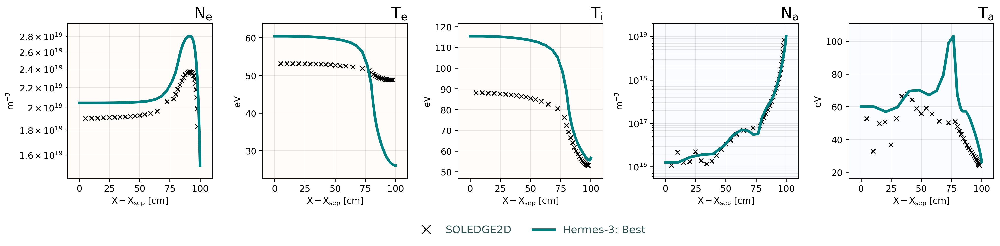

In [25]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    # "SOLEDGE2D: Wide domain" : dict(data=sl["widewall_2e19"], color="black", marker = "o", markerfacecolor="None", markeredgewidth = 0.5),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    # r"Hermes-3: Baseline" : dict(data=hr['base'], color = "teal"),
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    # r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "teal"),
    # r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "gold"),
    # r"Hermes-3: $\alpha_{frec}\times 0.0$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.00'], color = "khaki"),
    # r"Hermes-3: $\alpha_{frec}\times 0.4$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "gold"),
    
    # r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.68'], color = "teal"),
    r"Hermes-3: Best" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "teal"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "outer_fieldline"], 
    params = ["Ne", "Te", "Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1
)

In [51]:
hr["afnE_mfp1_cond0.25_frec0.48"].regions["outer_fieldline"].keys()

Index(['Td+', 'Ta', 'Te', 'Ne', 'Pe', 'Pd+', 'Pa', 'Na', 'Sd+_iz'], dtype='object')

## Te/Ti equilibration

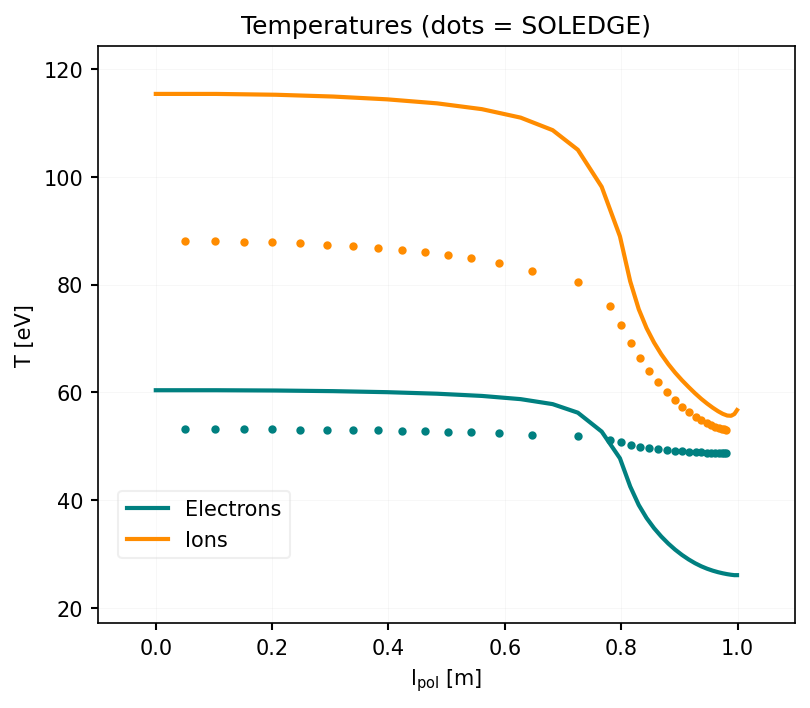

In [66]:
fig, ax = plt.subplots(dpi = 150)

sl_data = sl["tightwall_2e19"].regions["outer_fieldline"]
hr_data = hr["afnE_mfp1_cond0.25_frec0.48"].regions["outer_fieldline"]

slstyle = dict(marker = "o", ms = 3, lw = 0)
hrstyle = dict(lw = 2)

ax.plot(sl_data.index, sl_data["Te"], c = "teal", **slstyle)
ax.plot(sl_data.index, sl_data["Td+"], c = "darkorange", **slstyle)
# ax.plot(sl_data.index, sl_data["Ta"], c = "deeppink", **slstyle)

ax.plot(hr_data.index, hr_data["Te"], c = "teal", **hrstyle, label = "Electrons")
ax.plot(hr_data.index, hr_data["Td+"], c = "darkorange", **hrstyle, label = "Ions")

# ax2 = ax.twinx()
# ax2.plot(hr_data.index, hr_data["Rd+_ex"], c = "deeppink", **hrstyle, label = "Radiation")
# ax2.tick_params(axis = "y", colors = "deeppink") 
# ax.plot(hr_data.index, hr_data["Ta"], c = "deeppink", **hrstyle, label = "Neutrals")
# ax2.set_ylabel("Radiation [Wm-2]", color = "deeppink")

ax.set_xlabel("$l_{pol}$ [m]")
ax.set_ylabel("T [eV]")
ax.set_title("Temperatures (dots = SOLEDGE)")

fig.legend(bbox_to_anchor=(0.35,0.3))

### Could Ne determine Te?

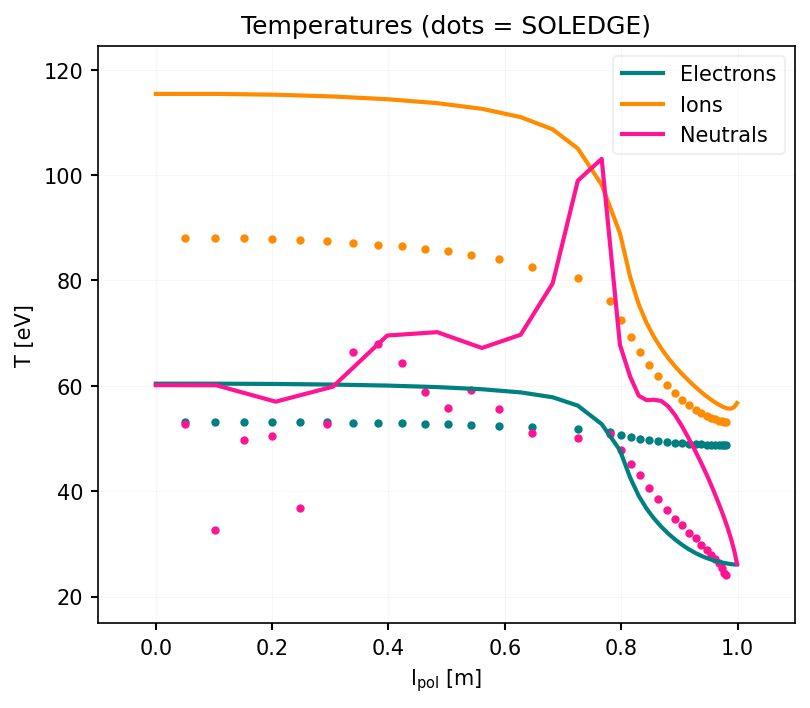

In [ ]:
fig, ax = plt.subplots(dpi = 150)

sl_data = sl["tightwall_2e19"].regions["outer_fieldline"]
hr_data = hr["afnE_mfp1_cond0.25_frec0.48"].regions["outer_fieldline"]

slstyle = dict(marker = "o", ms = 3, lw = 0)
hrstyle = dict(lw = 2)

ax.plot(sl_data.index, sl_data["Ne"], c = "teal", **slstyle)
# ax.plot(sl_data.index, sl_data["Td+"], c = "darkorange", **slstyle)
# ax.plot(sl_data.index, sl_data["Ta"], c = "deeppink", **slstyle)

# ax.plot(hr_data.index, hr_data["Te"], c = "teal", **hrstyle, label = "Electrons")
# ax.plot(hr_data.index, hr_data["Td+"], c = "darkorange", **hrstyle, label = "Ions")
# ax.plot(hr_data.index, hr_data["Ta"], c = "deeppink", **hrstyle, label = "Neutrals")

ax.set_xlabel("$l_{pol}$ [m]")
ax.set_ylabel("T [eV]")
ax.set_title("Temperatures (dots = SOLEDGE)")
ax.legend()

## Poloidal plots of pressure

In [37]:
slc = SOLEDGEcase(path=soledgecases["tightwall_2e19"])

# df = slc.get_1d_poloidal_data("Dense")


c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


In [41]:
params = ["Dense", "Densi", "Nni", "Nmi", "Tempe", "Tempi", "Tni", "Tmi", "Pni", "Ppi",  "TotRadi"]
df = slc.get_1d_poloidal_data(params = ["Dense"])

KeyboardInterrupt: 

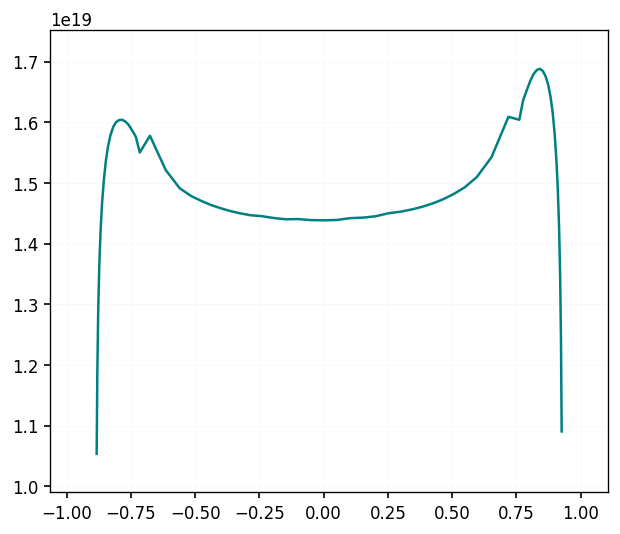

In [ ]:
plt.plot(df["dist"], df["Dense"])

In [68]:
ds.metadata["nxg"]

40

In [80]:
hd = Hermesdata()
hd.read_case(casestore["afnE_mfp1_cond0.25_frec0.68"].ds.isel(t=-1, x = slice(2,-2)))



36


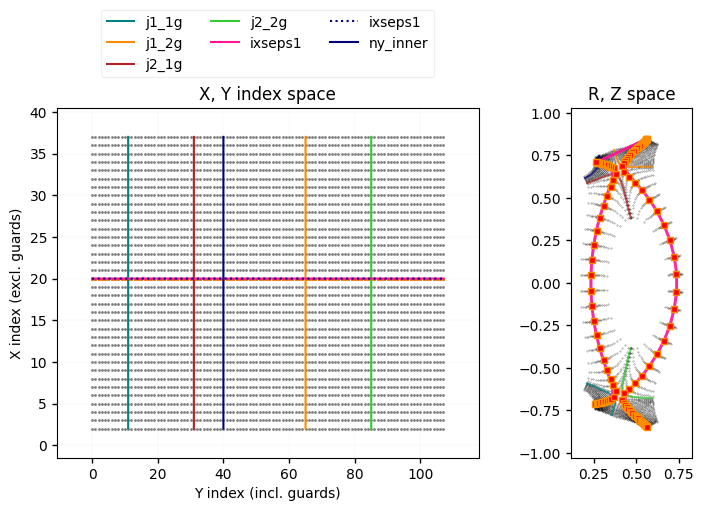

In [79]:
m = ds.metadata

dsng = ds.isel(x=slice(2,-2))
print(dsng.dims["x"])
plot_selection(dsng, dsng.isel(x= m["ixseps1"]-m["MXG"]))

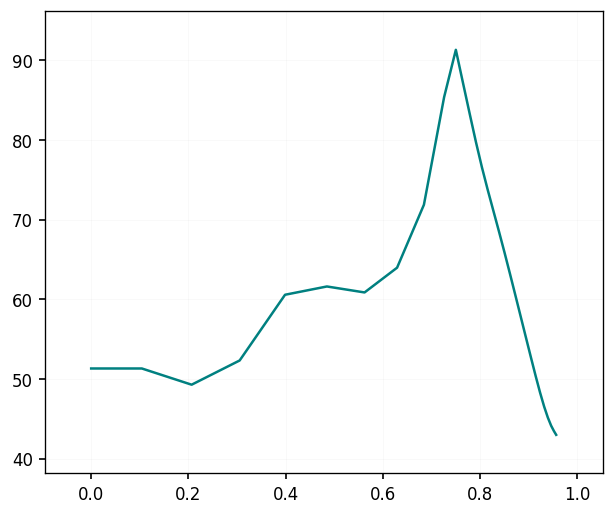

In [54]:
ds = casestore["afnE_mfp1_cond0.25_frec0.68"].ds
m = ds.metadata

param = "Td+"

# Find the right poloidal flux tube by looking at the midplane
sep_dist = 0.002
omp = ds.hermesm.select_region("outer_midplane_a")
id_sep = m["ixseps1"]

r = np.cumsum(omp["dr"].values)
r = r - r[id_sep]

id_fl = np.argmin(np.abs(r - sep_dist))
id_omp = int((m["j2_2g"] - m["j1_2g"]) / 2) + m["j1_2g"]
fl = ds.isel(theta = slice(id_omp, -m["MYG"]), x = id_fl, t = -1)

dist = np.cumsum(fl["dl"].values)
dist -= dist[0]

df = pd.DataFrame(index = dist)
params = ["Td+", "Td", "Te", "Ne", "Pe", "Pd+", "Pd", "Nd", "Sd+_iz"]

for param in params:
    df[param] = fl[param].values


plt.plot(df.index, df["Td"])



In [50]:
dist

array([0.        , 0.10466556, 0.20741715, 0.30657816, 0.40041839,
       0.48685488, 0.56482507, 0.63187652, 0.68626222, 0.72292908,
       0.74053234, 0.75124532, 0.76126332, 0.77125267, 0.78143819,
       0.79182016, 0.80237334, 0.81306747, 0.82386686, 0.8347317 ,
       0.84558485, 0.85628748, 0.86671154, 0.87678378, 0.88641559,
       0.89550796, 0.90397095, 0.91168632, 0.91852576, 0.92436658,
       0.92909692])

In [38]:
r

array([-0.06738559, -0.05668228, -0.04761917, -0.03988029, -0.0332466 ,
       -0.02755599, -0.02268255, -0.01852431, -0.01499575, -0.01202277,
       -0.00953769, -0.00748042, -0.00579658, -0.00443542, -0.00334845,
       -0.00248865, -0.00180986, -0.00126651, -0.00081333, -0.0004053 ,
        0.        ,  0.00043491,  0.00092921,  0.0015126 ,  0.00221472,
        0.0030651 ,  0.00409326,  0.00532866,  0.00680092,  0.00853993,
        0.01057623,  0.01294152,  0.01566917,  0.01879138,  0.02233927,
        0.02634314,  0.03083184,  0.03583194,  0.0413666 ,  0.04745607])

# Impact of molecules

## Atom and molecular density plots

In [133]:
casestore.keys()


dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68'])

### On the target

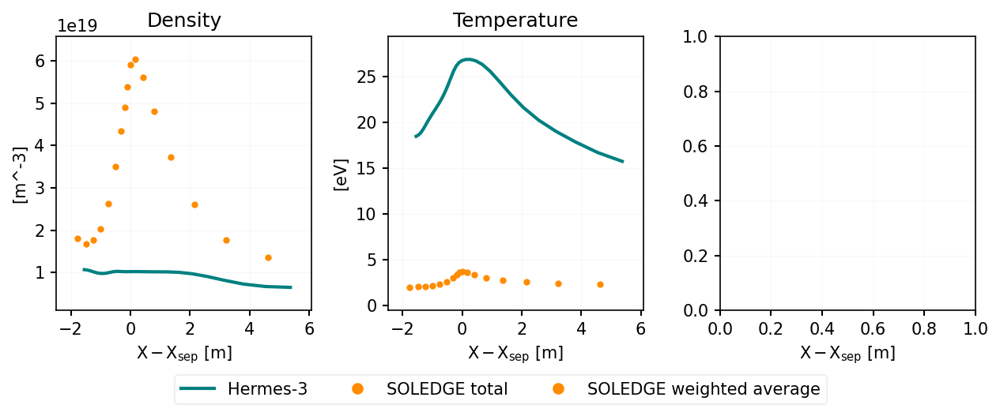

In [19]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,3, figsize=(10,3), dpi = 150)
fig.subplots_adjust(wspace=0.3)
region = "outer_lower"
ax = axes[0]
hermes = hr["afnE_mfp1_cond0.25_frec0.48"].regions[region]
sol = sl["tightwall_2e19"].regions[region]
sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100

atomstyle = dict(lw=0, marker = "o", c = "darkorange", ms = 3)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)

lw = 2
ax.plot(hermes.index*100, hermes["Na"], lw = lw, label = "Hermes-3")
# ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
# ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
ax.plot(sol.index, sol["Nm"]*2+sol["Na"], label = "SOLEDGE total", **atomstyle)
ax.set_ylabel("[m^-3]")
ax.set_title("Density")

ax = axes[1]
ax.plot(hermes.index*100, hermes["Ta"], lw = lw)
# ax.plot(sol.index, sol["Ta"], **atomstyle)
# ax.plot(sol.index, sol["Tm"], **molstyle)
weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
ax.plot(sol.index, weighted_temp, label = "SOLEDGE weighted average", **atomstyle)
ax.set_ylabel("[eV]")
ax.set_title("Temperature")

# ax = axes[2]
# ax.plot(hermes.index*100, hermes["Pa"], lw = lw)
# ax.plot(sol.index,  sol["Na"] * sol["Ta"]*constants("q_e"), **atomstyle)
# ax.plot(sol.index, sol["Nm"] * sol["Tm"]*constants("q_e"), **molstyle)

# ax.set_ylabel("[Pa]")
# ax.set_title("Pressure")
fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.05), ncols = 3)
for ax in axes:
    
    ax.set_xlabel("$X-X_{sep}$ [m]")
    # ax.set_yscale("log")

# TRY POLOIDAL OF ABOVE

### On the midplane

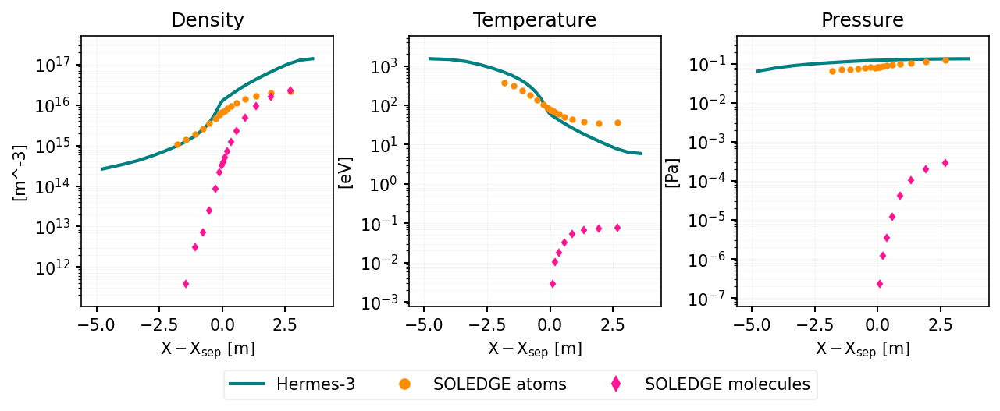

In [182]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,3, figsize=(10,3), dpi = 150)
fig.subplots_adjust(wspace=0.3)
region = "omp"
ax = axes[0]
hermes = hr["afnE_mfp1_cond0.25_frec0.48"].regions[region]
sol = sl["tightwall_2e19"].regions[region]
sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100

atomstyle = dict(lw=0, marker = "o", c = "darkorange", ms = 3)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)

lw = 2
ax.plot(hermes.index*100, hermes["Na"], lw = lw, label = "Hermes-3")
ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
# ax.plot(sol.index, sol["Nm"]*2+sol["Na"], lw = lw, label = "SOLEDGE total", c = "k", ls = ":")
ax.set_ylabel("[m^-3]")
ax.set_title("Density")

ax = axes[1]
ax.plot(hermes.index*100, hermes["Ta"], lw = lw)
ax.plot(sol.index, sol["Ta"], **atomstyle)
ax.plot(sol.index, sol["Tm"], **molstyle)
weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
# ax.plot(sol.index, weighted_temp, lw = lw, label = "SOLEDGE weighted average", c = "k", ls = ":")
ax.set_ylabel("[eV]")
ax.set_title("Temperature")

ax = axes[2]
ax.plot(hermes.index*100, hermes["Pa"], lw = lw)
ax.plot(sol.index,  sol["Na"] * sol["Ta"]*constants("q_e"), **atomstyle)
ax.plot(sol.index, sol["Nm"] * sol["Tm"]*constants("q_e"), **molstyle)

ax.set_ylabel("[Pa]")
ax.set_title("Pressure")
fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.05), ncols = 3)
for ax in axes:
    
    ax.set_xlabel("$X-X_{sep}$ [m]")
    ax.set_yscale("log")

### Midplane with effective density/temperature

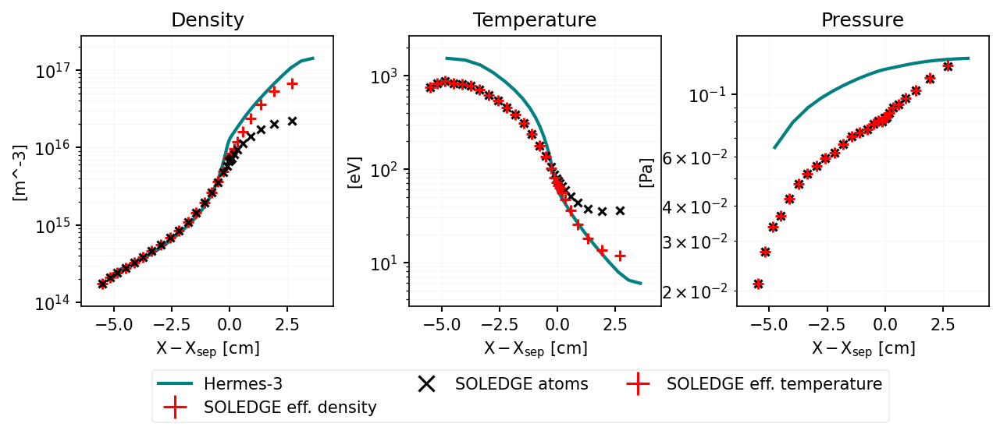

In [34]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,3, figsize=(10,3), dpi = 150)
fig.subplots_adjust(wspace=0.3)
region = "omp"

hermes = hr["afnE_mfp1_cond0.25_frec0.48"].regions[region]
sol = sl["tightwall_2e19"].regions[region].copy()
# sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100

atomstyle = dict(lw=0, marker = "x", c = "black", ms = 5, markeredgewidth = 1.5)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)
effstyle = dict(lw=0, marker = "+", c = "red", ms = 7, markeredgewidth = 1.5)

lw = 2
ax = axes[0]

ax.plot(hermes.index*100, hermes["Na"], lw = lw, label = "Hermes-3")
ax.plot(sol.index, sol["Na"] + 2*sol["Nm"], label = "SOLEDGE eff. density", **effstyle)
ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
# ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
ax.set_ylabel("[m^-3]")
ax.set_title("Density")

ax = axes[1]
ax.plot(hermes.index*100, hermes["Ta"], lw = lw)
ax.plot(sol.index, sol["Ta"], **atomstyle)
# ax.plot(sol.index, sol["Tm"], **molstyle)
weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
ax.plot(sol.index, weighted_temp, label = "SOLEDGE eff. temperature", **effstyle)
ax.set_ylabel("[eV]")
ax.set_title("Temperature")

ax = axes[2]
ax.plot(hermes.index*100, hermes["Pa"], lw = lw)
ax.plot(sol.index,  sol["Na"] * sol["Ta"]*constants("q_e"), **atomstyle)
# ax.plot(sol.index, sol["Nm"] * sol["Tm"]*constants("q_e"), **molstyle)
weighted_p = ((sol["Ta"]*constants("q_e") * sol["Na"]) + (sol["Tm"]*constants("q_e") * sol["Nm"]*2))
ax.plot(sol.index, weighted_p, **effstyle)
ax.set_ylabel("[Pa]")
ax.set_title("Pressure")

fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.05), ncols = 3)
for ax in axes:
    
    ax.set_xlabel("$X-X_{sep}$ [cm]")
    ax.set_yscale("log")

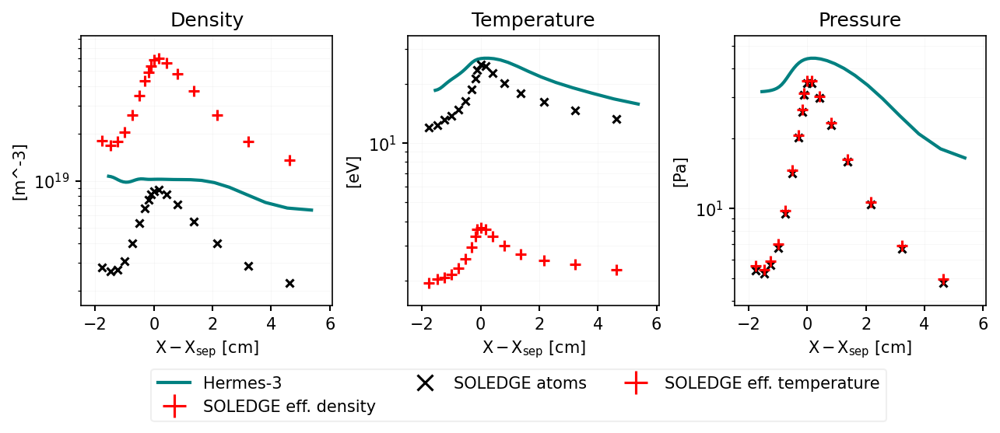

In [36]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,3, figsize=(10,3), dpi = 150)
fig.subplots_adjust(wspace=0.3)
region = "outer_lower"

hermes = hr["afnE_mfp1_cond0.25_frec0.48"].regions[region]
sol = sl["tightwall_2e19"].regions[region].copy()
sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100

atomstyle = dict(lw=0, marker = "x", c = "black", ms = 5, markeredgewidth = 1.5)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)
effstyle = dict(lw=0, marker = "+", c = "red", ms = 7, markeredgewidth = 1.5)

lw = 2
ax = axes[0]

ax.plot(hermes.index*100, hermes["Na"], lw = lw, label = "Hermes-3")
ax.plot(sol.index, sol["Na"] + 2*sol["Nm"], label = "SOLEDGE eff. density", **effstyle)
ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
# ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
ax.set_ylabel("[m^-3]")
ax.set_title("Density")

ax = axes[1]
ax.plot(hermes.index*100, hermes["Ta"], lw = lw)
ax.plot(sol.index, sol["Ta"], **atomstyle)
# ax.plot(sol.index, sol["Tm"], **molstyle)
weighted_temp = ((sol["Ta"] * sol["Na"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Na"] + sol["Nm"]*2)
ax.plot(sol.index, weighted_temp, label = "SOLEDGE eff. temperature", **effstyle)
ax.set_ylabel("[eV]")
ax.set_title("Temperature")

ax = axes[2]
ax.plot(hermes.index*100, hermes["Pa"], lw = lw)
ax.plot(sol.index,  sol["Na"] * sol["Ta"]*constants("q_e"), **atomstyle)
# ax.plot(sol.index, sol["Nm"] * sol["Tm"]*constants("q_e"), **molstyle)
weighted_p = ((sol["Ta"]*constants("q_e") * sol["Na"]) + (sol["Tm"]*constants("q_e") * sol["Nm"]*2))
ax.plot(sol.index, weighted_p, **effstyle)
ax.set_ylabel("[Pa]")
ax.set_title("Pressure")

fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.05), ncols = 3)
for ax in axes:
    
    ax.set_xlabel("$X-X_{sep}$ [cm]")
    ax.set_yscale("log")

### Only density

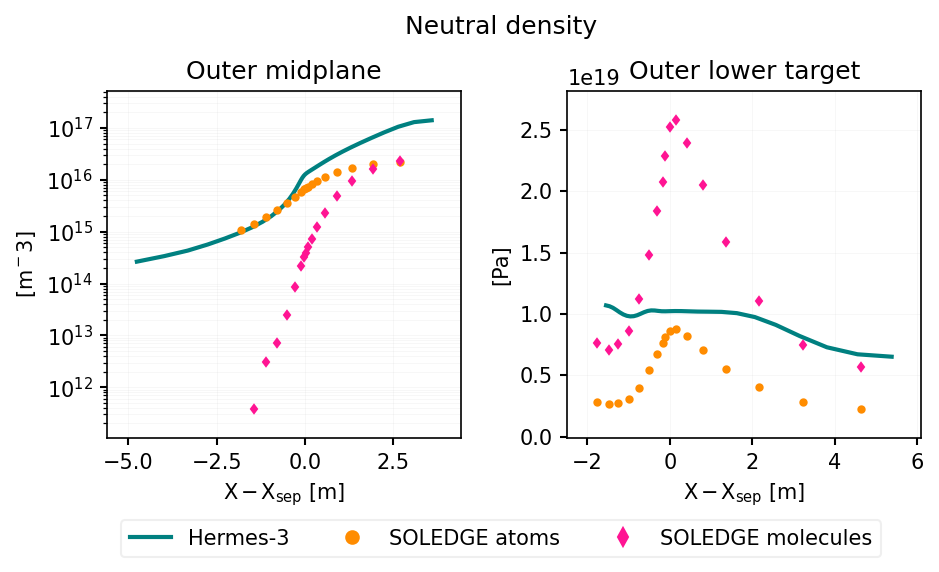

In [266]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,2, figsize=(7,3), dpi = 150)
fig.subplots_adjust(wspace=0.3)
fig.suptitle("Neutral density", y = 1.05)
region = "outer_lower"

atomstyle = dict(lw=0, marker = "o", c = "darkorange", ms = 3)
molstyle = dict(lw=0, marker = "d", c = "deeppink", ms = 3)
ax = axes[0]
hermes = hr["afnE_mfp1_cond0.25_frec0.48"].regions["omp"]
sol = sl["tightwall_2e19"].regions["omp"]
sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100


lw = 2
ax.plot(hermes.index*100, hermes["Na"], lw = lw, label = "Hermes-3")
ax.plot(sol.index, sol["Na"], label = "SOLEDGE atoms", **atomstyle)
ax.plot(sol.index, sol["Nm"], label = "SOLEDGE molecules", **molstyle)
# ax.plot(sol.index, sol["Nm"]*2+sol["Na"], lw = lw, label = "SOLEDGE total", c = "k", ls = ":")
ax.set_ylabel("[$m^-3$]")
ax.set_title("Outer midplane")
ax.set_yscale("log")


ax = axes[1]
hermes = hr["afnE_mfp1_cond0.25_frec0.48"].regions["outer_lower"]
sol = sl["tightwall_2e19"].regions["outer_lower"]
sol = sol.query("index <0.05 and index > -0.02")
sol.index *= 100

lw = 2
ax.plot(hermes.index*100, hermes["Na"], lw = lw)
ax.plot(sol.index, sol["Na"], **atomstyle)
ax.plot(sol.index, sol["Nm"], **molstyle)
ax.set_ylabel("[$m^-3$]")
ax.set_title("Density")

ax.set_ylabel("[Pa]")
ax.set_title("Outer lower target")
fig.legend(loc = "upper center", bbox_to_anchor = (0.5, -0.05), ncols = 3)
for ax in axes:
    
    ax.set_xlabel("$X-X_{sep}$ [m]")
    # ax.set_yscale("log")

In [ ]:
import sdtools.general.plotstyle
fig, axes = plt.subplots(1,2, figsize=(8,3), dpi = 150)

ax = axes[0]
hermes = hr["physical"].regions["outer_lower"]
sol = sl["tightwall_2e19"].regions["outer_lower"]
sol = sol.query("index <0.05 and index > -0.02")

# Ptot = sol[""]

lw = 2
ax.plot(hermes.index, hermes["Pd"], lw = lw, label = "Hermes-3: fast recycling")
ax.plot(sol.index, sol["Pn"], lw = lw, label = "SOLEDGE atoms", c = "k", ls = "-")
ax.plot(sol.index, sol["Pm"], lw = lw, label = "SOLEDGE molecules", c = "k", ls = "--")
ax.plot(sol.index, sol["Pm"]*2+sol["Nn"], lw = lw, label = "SOLEDGE total", c = "k", ls = ":")
ax.set_ylabel("Density [m^-3]")
ax.set_title("Neutral density")

ax = axes[1]
ax.plot(hermes.index, hermes["Td"], lw = lw, label = "Hermes-3: fast recycling")
ax.plot(sol.index, sol["Tn"], lw = lw, label = "SOLEDGE atoms", c = "k", ls = "-")
ax.plot(sol.index, sol["Tm"], lw = lw, label = "SOLEDGE molecules", c = "k", ls = "--")
weighted_temp = ((sol["Tn"] * sol["Nn"]) + (sol["Tm"] * sol["Nm"]*2)) / (sol["Nn"] + sol["Nm"]*2)
ax.plot(sol.index, weighted_temp, lw = lw, label = "SOLEDGE weighted average", c = "k", ls = ":")
ax.set_ylabel("Temperature")
ax.set_title("Neutral temperature")

for ax in axes:
    ax.legend(fontsize=8, loc = "upper right")
    ax.set_xlabel("dist from sep [m]")

## Molecule fraction 2D plot

#### Without wide grid

0 1


Text(0, 0.5, 'Z [m]')

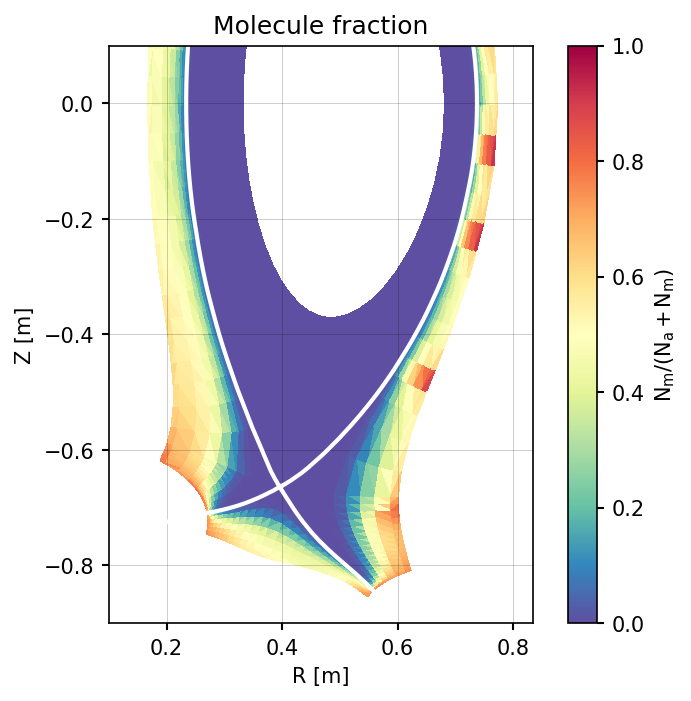

In [280]:

fig, ax = plt.subplots(dpi = 150, figsize = (6,5))


slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
Na = slc._get_2d_on_tri("Nni")
Nm = slc._get_2d_on_tri("Nmi")
mfrac = Nm / (Na + Nm)
slc.plot_2d(data = mfrac, fig=fig, ax=ax, cbar = True, cbar_label = "$N_{m}/(N_{a}+N_{m})$", logscale = False, vmin = 0, vmax = 1, cmap = "Spectral_r")
ax.set_title("Molecule fraction")
ax.set_ylim(-0.9, 0.1)
ax.grid(alpha = 0.3, c = "k")
ax.set_xlabel("R [m]")
ax.set_ylabel("Z [m]")


#### With wide grid

0 1
0 1


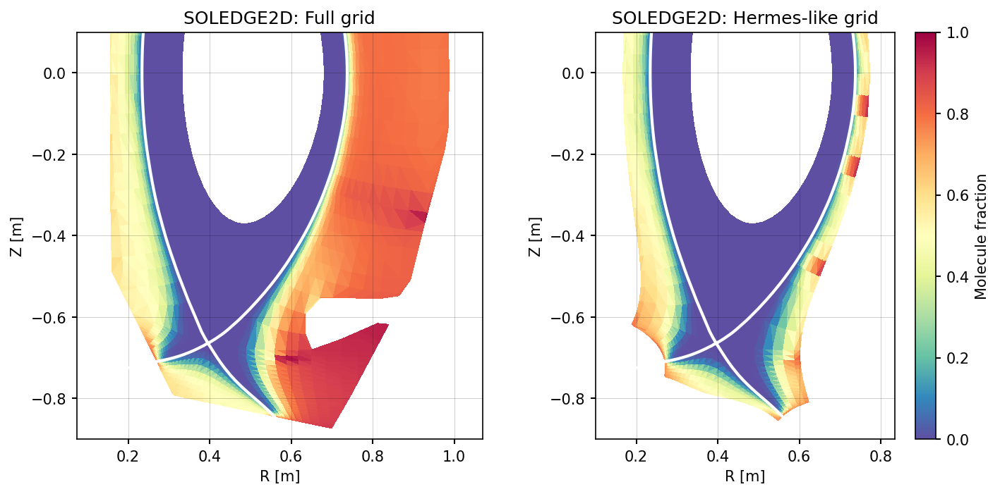

In [132]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (11,5))

slc = SOLEDGEcase(path = soledgecases["widewall_2e19"])
Na = slc._get_2d_on_tri("Nni")
Nm = slc._get_2d_on_tri("Nmi")
mfrac = Nm / (Na + Nm)
slc.plot_2d(data = mfrac, fig=fig, ax=axes[0], cbar = False, logscale = False, vmin = 0, vmax = 1, cmap = "Spectral_r")
axes[0].set_title("SOLEDGE2D: Full grid")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
Na = slc._get_2d_on_tri("Nni")
Nm = slc._get_2d_on_tri("Nmi")
mfrac = Nm / (Na + Nm)
slc.plot_2d(data = mfrac, fig=fig, ax=axes[1], cbar = True, cbar_label = "Molecule fraction", logscale = False, vmin = 0, vmax = 1, cmap = "Spectral_r")
axes[1].set_title("SOLEDGE2D: Hermes-like grid")

for ax in axes:
    ax.set_ylim(-0.9, 0.1)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")


# Radiation

In [215]:
ds["Nd"].shape

(0, 108)

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


1000.0 1000000.0


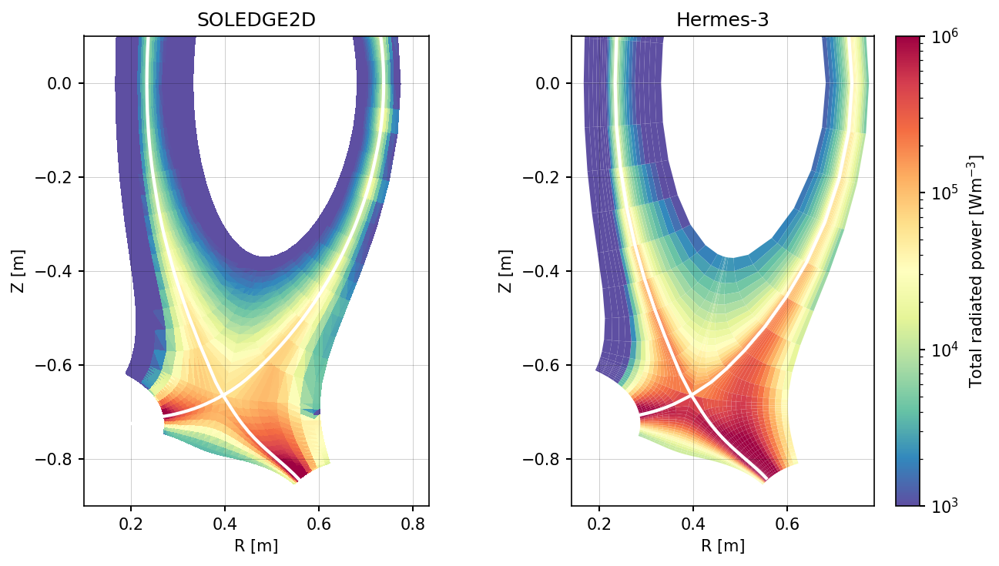

In [271]:

slc_wide = SOLEDGEcase(path = soledgecases["widewall_2e19"])

fig, axes = plt.subplots(1,2, dpi = 150, figsize = (9,5))

vmin = 1e3
vmax = 1e6

# slc = SOLEDGEcase(path = soledgecases["widewall_2e19"])
# slc.plot_2d(param = "TotRadi", fig=fig, ax=axes[0], cbar = False, logscale = True, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
# axes[0].set_title("SOLEDGE2D: Full grid")
# axes[0].set_xlim(0.15, 1.0)

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
slc.plot_2d(param = "TotRadi", fig=fig, ax=axes[0], cbar = False, cbar_label = "Molecule fraction", logscale = True, vmin = vmin, vmax = vmax, cmap = "Spectral_r")
axes[0].set_title("SOLEDGE2D")

slc = SOLEDGEcase(path = soledgecases["tightwall_2e19"])
ds = casestore["afnE_mfp1_cond0.25_frec0.48"].ds.isel(t=-1,  theta=slice(2,-2))
totrad = (abs(ds["Rd+_ex"]) + abs(ds["Rd+_rec"]))
totrad.hermesm.clean_guards().hermesm.polygon(ax = axes[1], cmap = "Spectral_r", vmin = vmin, vmax = vmax, logscale = True, antialias = True, colorbar_label = "Total radiated power [$Wm^{-3}$]")
axes[1].set_title("Hermes-3")


for ax in axes:
    ax.set_ylim(-0.9, 0.1)
    ax.grid(alpha = 0.3, c = "k")
    ax.set_xlabel("R [m]")
    ax.set_ylabel("Z [m]")
fig.tight_layout()

# Neutral reflection

In [294]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl'])

In [ ]:
casestore["afnE_mfp1_cond0.25_frec0.48_nonrefl"].ds.hermesm.select_region("outer_midplane_a")[""]

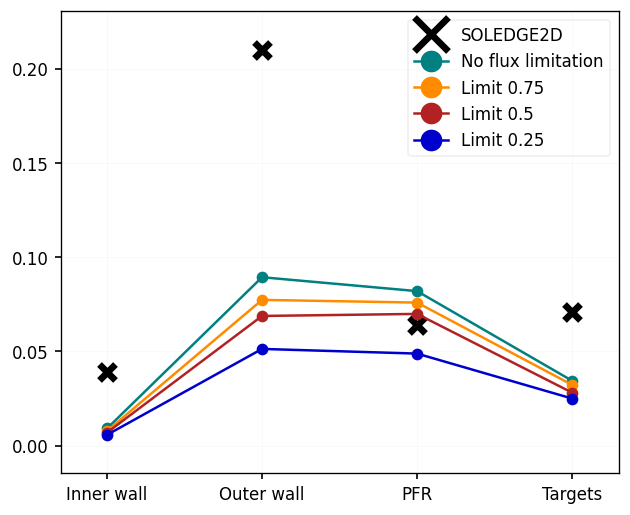

In [56]:
# ds = casestore["afnE_mfp1_cond0.25_frec0.48"].ds
# ds = casestore["afnE_mfp1_cond0.25"].ds
ds = casestore['afnE_mfp1'].ds
balances = {}
for name in ["afnE_mfp1", "afnE_mfp1_cond0.75", "afnE_mfp1_cond0.5", "afnE_mfp1_cond0.25",]:
    ds = casestore[name].ds
    out = calculate_simple_heat_balance(ds.isel(t=-1), verbose = False).values()

    balances[name] = np.array(list(out))*-1

fig, ax = plt.subplots()
ax.set_xticks([0,1,2,3])
ax.set_xticklabels(["Inner wall", "Outer wall", "PFR", "Targets"])

kwargs = dict(marker="o")
ax.plot([0.039, 0.210, 0.064, 0.071], label = "SOLEDGE2D", marker = "x", c = "k", lw = 0, ms = 10, markeredgewidth=4)
ax.plot(balances["afnE_mfp1"], **kwargs, label = "No flux limitation")
ax.plot(balances["afnE_mfp1_cond0.75"], **kwargs, label = "Limit 0.75")
ax.plot(balances["afnE_mfp1_cond0.5"], **kwargs, label = "Limit 0.5")
ax.plot(balances["afnE_mfp1_cond0.25"], **kwargs, label = "Limit 0.25")

ax.legend()

In [45]:
balances[]

{'afnE_mfp1': [], 'afnE_mfp1_cond0.25': []}

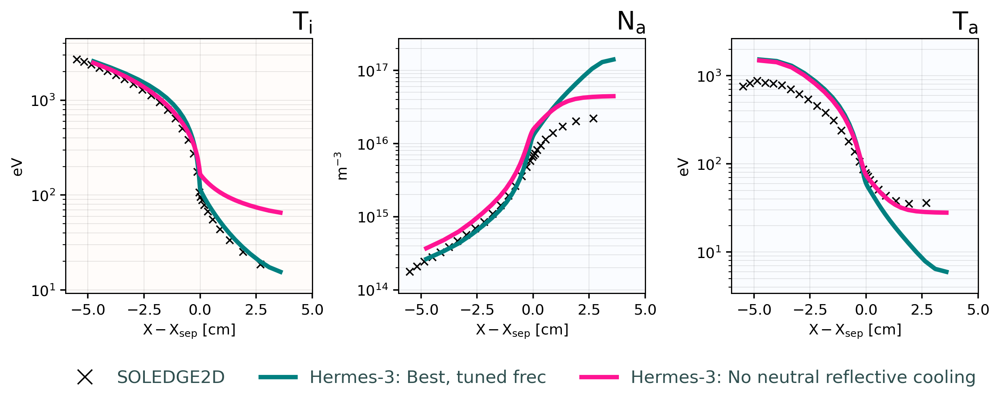

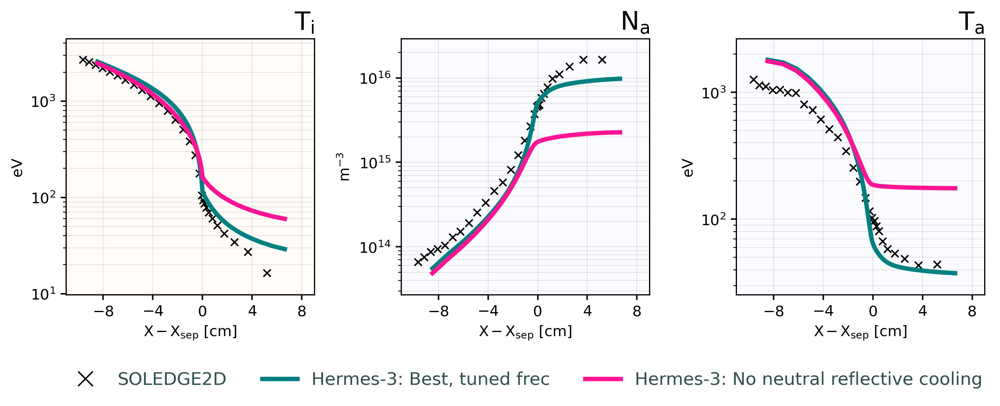

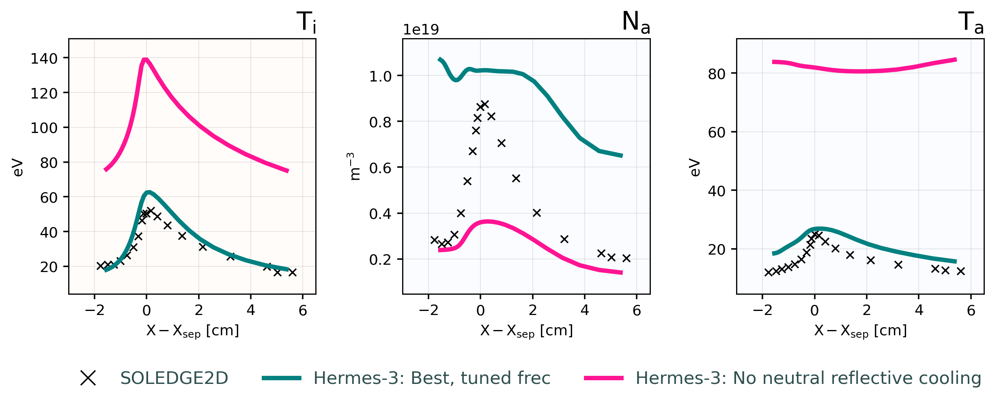

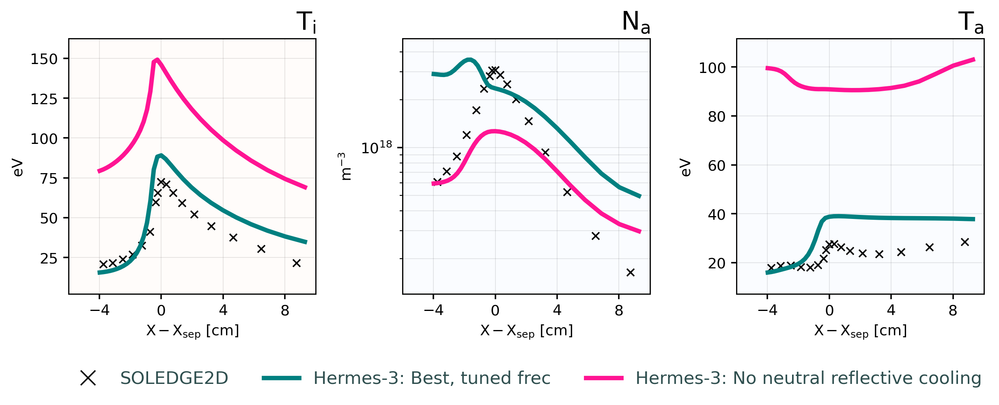

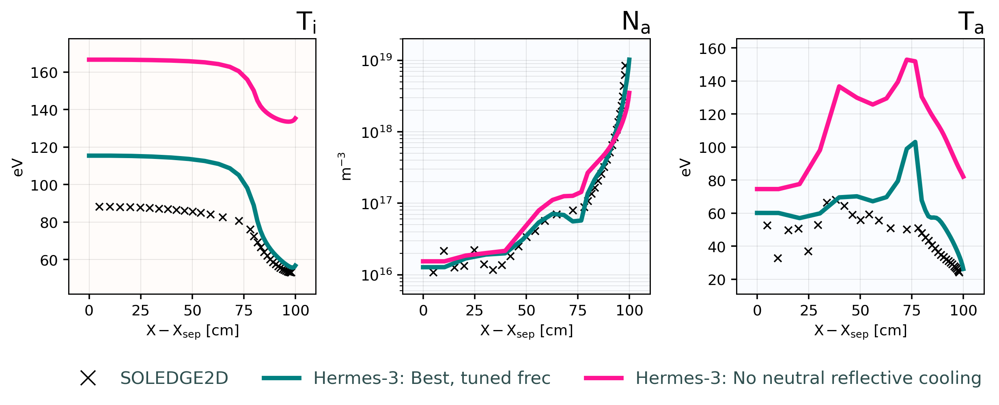

In [40]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black", marker = "x"),
    r"Hermes-3: Best, tuned frec" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "teal"),
    r"Hermes-3: No neutral reflective cooling" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48_nonrefl'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "inner_lower", "outer_fieldline"],
    params = ["Td+", "Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],

    mode = "log",
    dpi = 200,
    lw = 2,
    legend_nrows = 1
)

# More 2D comparisons

In [285]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.00', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68', 'afnE_mfp1_cond0.25_frec0.48_nonrefl'])

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


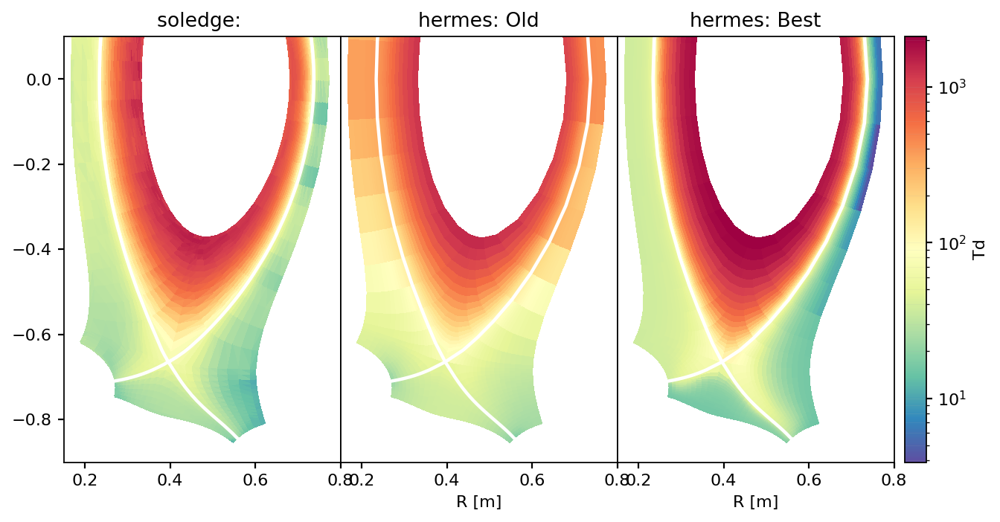

In [293]:
plt.close("all")
v = viewer_2d(
    "Td",
    [
        {"name" : "", "code":"soledge", "path" : soledgecases["tightwall_2e19"]},

        {"name" : "Old", "code" : "hermes", "ds" : casestore['base'].ds.isel(t=-1)},
        {"name" : "Best", "code" : "hermes", "ds" : casestore['afnE_mfp1_cond0.25_frec0.48'].ds.isel(t=-1)},
        # {"name" : "New, MFP=10m", "code" : "hermes", "ds" : casestore['afnE_mfp1_cond0.25_frec0.48'].ds.isel(t=-1)},
    ],
    logscale = True,
    # vmin = 0,
    # vmax = 200,
    # vmin = 1e17,
    # vmax = 1e19,
    dpi = 160,
    ylim = (-0.9,0.1),
    xlim = (0.15, 0.8),
    wspace = 0.0,
    cmap = "Spectral_r",
    slider = False
)

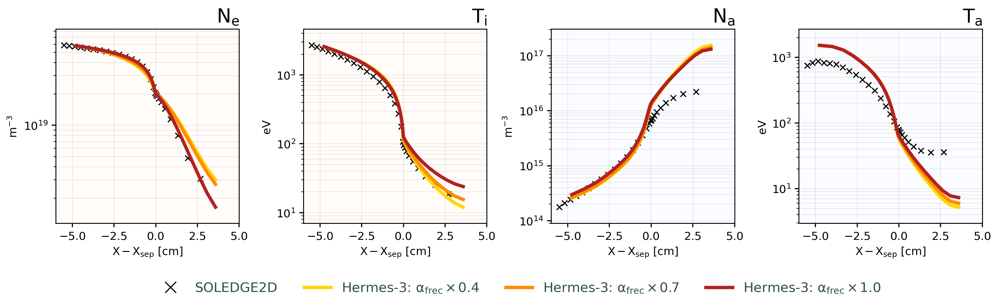

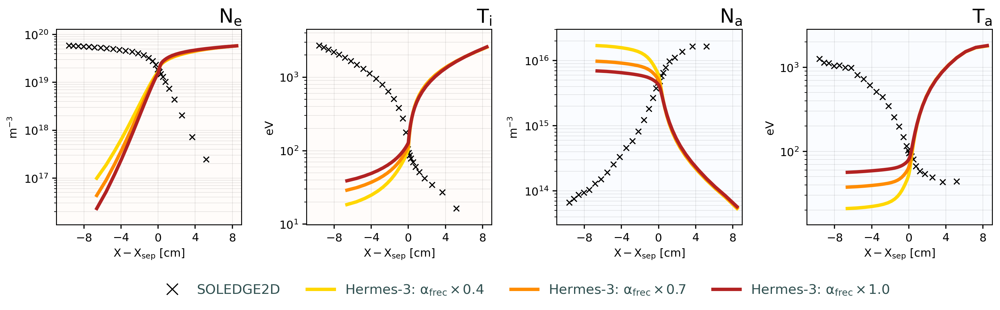

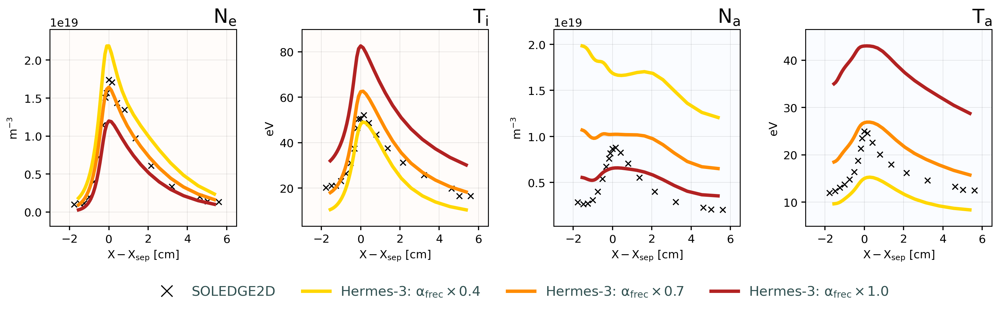

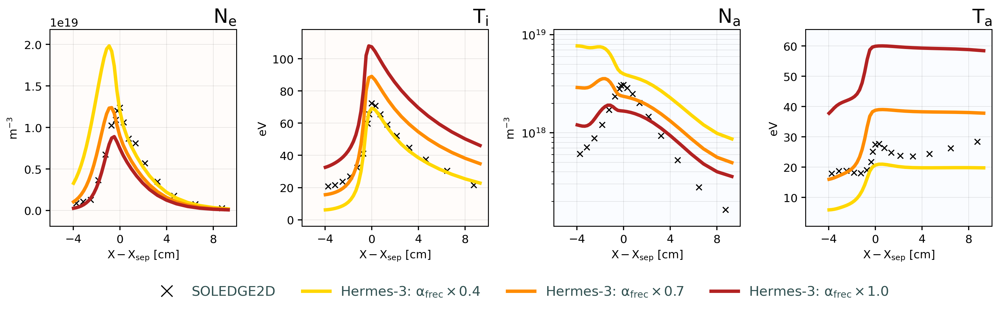

In [79]:

plt.close("all")
lineplot_compare(
    cases = { 


    "SOLEDGE2D" : dict(data=sl["tightwall_2e19"], color="black"),
    # "SOLPS: 2e19 (tight)" : dict(data=sp["nsep_3e19"], color="red"),
    # r"Hermes-3: Baseline" : dict(data=hr['base'], color = "teal"),
    # "Hermes-3: frec tune" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: combined cond/conv" : dict(data=hr['afn_tunefrec'], color = "darkorange"),
    # r"Hermes-3: Old model" : dict(data=hr['frec_tune'], color = "teal"),
    # r"Hermes-3: Improved model" : dict(data=hr['afnE_mfp1'], color = "teal"),
    # r"Hermes-3: Conductivity $\alpha = 0.75$" : dict(data=hr['afnE_mfp1_cond0.75'], color = "gold"),
    r"Hermes-3: $\alpha_{frec}\times 0.4$" : dict(data=hr['afnE_mfp1_cond0.25'], color = "gold"),
    r"Hermes-3: $\alpha_{frec}\times 0.7$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.48'], color = "darkorange"),
    r"Hermes-3: $\alpha_{frec}\times 1.0$" : dict(data=hr['afnE_mfp1_cond0.25_frec0.68'], color = "firebrick"),
    # r"Hermes-3: E" : dict(data=hr['frec'], color = "limegreen"),
    # r"Hermes-3: New, MFP=10m" : dict(data=hr['afnnew_mfp10'], color = "deeppink"),

    },
    regions = ["omp", "imp", "outer_lower", "inner_lower"], 
    # regions = ["outer_lower"],
    # params = ["Ne", "Te"],
    params = ["Ne", "Td+", "Na", "Ta"],
    # params = ["Ne", "Te", "Na", "Ta"],
    # params = ["Na", "Ta"],
    # params = ["Pe", "Pd+", "Pa"],
    mode = "log",
    dpi = 200,
    lw = 2
)

In [29]:
casestore.keys()

dict_keys(['base', 'esccore_edgerefl_decaylength', 'frec', 'pump', 'frec_tune', 'afnD_mfp1', 'afnE_mfp1', 'afnE_mfp1_cond0.75', 'afnE_mfp1_cond0.5', 'afnE_mfp1_cond0.25', 'afnE_mfp1_cond0.25_frec0.48', 'afnE_mfp1_cond0.25_frec0.68'])

c:\Users\mikek\OneDrive\Project\python-packages\soledge\routines\h5_routines.py:65: FutureWarning: In the future `np.str` will be defined as the corresponding NumPy scalar.
  Data = Data.astype(np.str)


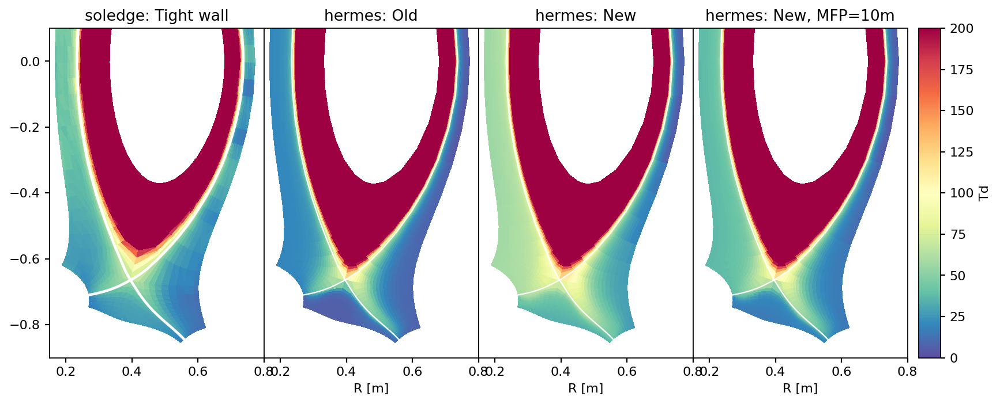

In [30]:
plt.close("all")
v = viewer_2d(
    "Td",
    [
        {"name" : "Tight wall", "code":"soledge", "path" : soledgecases["tightwall_2e19"]},

        {"name" : "Old", "code" : "hermes", "ds" : casestore['afnE_mfp1_cond0.25'].ds.isel(t=-1)},
        {"name" : "New", "code" : "hermes", "ds" : casestore['afnE_mfp1_cond0.25_frec0.68'].ds.isel(t=-1)},
        {"name" : "New, MFP=10m", "code" : "hermes", "ds" : casestore['afnE_mfp1_cond0.25_frec0.48'].ds.isel(t=-1)},
    ],
    logscale = False,
    vmin = 0,
    vmax = 200,
    # vmin = 1e17,
    # vmax = 1e19,
    dpi = 160,
    ylim = (-0.9,0.1),
    xlim = (0.15, 0.8),
    wspace = 0.0,
    cmap = "Spectral_r",
    slider = False
)